<a href="https://colab.research.google.com/github/CIA-Oceanix/4dvarnet-core/blob/4dvarnet-mm-tgrs/notebook_visu_4DvarNet_SLANATL60_SST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
#import pyqg

from skimage.util import view_as_blocks
from netCDF4 import Dataset
import os
from skimage.transform import resize



In [2]:
!pip install zenodo-get

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=9f8921d59fac9c38ef10070e1b65fa38237bfd03deadd228a02e64298d20ea4d
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget


In [3]:
import os
os.mkdir('/content/4dvarnet-res')
os.chdir('/content/4dvarnet-res')

In [4]:
!zenodo_get 10.5281/zenodo.7429391

Title: 4dvarnet models for the reconstruction of SSH fields from SST-SSH synergies
Keywords: SSH mapping, SWOT, deep learning, 4dvarnet
Publication date: 2022-12-12
DOI: 10.5281/zenodo.7429391
Total size: 732.0 MB

Link: https://zenodo.org/api/files/b821bce7-4520-49cd-a35b-ec3b381bb346/modelSLA-4dvarnet-mmstate-sstobs-nolinear-tanh-bn_20.ckpt   size: 19.8 MB

Checksum is correct. (91102ee0c9586840dbf0d501eb6f4e55)

Link: https://zenodo.org/api/files/b821bce7-4520-49cd-a35b-ec3b381bb346/modelSLA-4dvarnet-mmstate-sstobs-nolinear-tanh-bn_20-res_testdata.nc   size: 275.3 MB

Checksum is correct. (260ba0e1c24f282b96dbf3a5aa84bb6f)

Link: https://zenodo.org/api/files/b821bce7-4520-49cd-a35b-ec3b381bb346/modelSLA-4dvarnet-sstobs-linear-bn_03.ckpt   size: 17.7 MB

Checksum is correct. (62109895d2b53022da3fa65fbe140e1a)

Link: https://zenodo.org/api/files/b821bce7-4520-49cd-a35b-ec3b381bb346/modelSLA-4dvarnet-sstobs-linear-bn_03-res_testdata.nc   size: 67.8 MB

Checksum is correct. (06e7b7c8cf9

In [5]:
# vertical velocity field
def compute_av2DPool( x , kk ):
    # downsampled version
    block_shape = (kk,kk)

    # see astronaut as a matrix of blocks (of shape block_shape)
    x_lr = view_as_blocks(x[:,:], block_shape)

    x_lr = x_lr.reshape(x_lr.shape[0], x_lr.shape[1],  -1)
    x_lr = np.mean(x_lr, axis=2)


    return x_lr

In [6]:
#ncfile = 'modelSLA-4dvarnet-mmstate-sstobs-nolinear-tanh-bn_20-res_testdata.nc'
ncfile = 'modelSLA-4dvarnet-sstobs-nolinear-tanh-bn_20_restestdata.nc'
#ncfile = 'modelSLA-4dvarnet-sstobs-linear-bn_03-res_testdata.nc'
#ncfile = 'modelSLA-unet-std-DirectInv-wSST_restestdata.nc'

dataset = Dataset(ncfile)
dataset

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    dimensions(sizes): lat(200), lon(200), time(40), feat(41)
    variables(dimensions): float64 longitude(lat, lon), float64 latitude(lat, lon), int64 Time(time), float32 ssh_gt(time, lat, lon), float32 ssh_obs(time, lat, lon), float32 ssh_oi(time, lat, lon), float32 ssh_rec(time, lat, lon), float32 sst_feat(time, feat, lat, lon), float64 lon(lon), float64 lat(lat), int64 time(time), int64 feat(feat)
    groups: 

In [7]:
latitude = dataset['latitude'][:]
longitude = dataset['longitude'][:]

ssh_gt = dataset['ssh_gt'][:]
ssh_oi = dataset['ssh_oi'][:]
ssh_rec = dataset['ssh_rec'][:]
ssh_obs = dataset['ssh_obs'][:]#dataset['ssh_gt'][:]#
sst_feat = dataset['sst_feat'][:]

dataset.close()

In [8]:
mse_ssh_rec = np.mean( (ssh_rec - ssh_gt)**2 ) 
mse_ssh_oi = np.mean( (ssh_oi - ssh_gt)**2 ) 

print('..... mse SSH: OI = %.2e -- 4DVarNet = %.2e'%(mse_ssh_oi,mse_ssh_rec))

..... mse SSH: OI = 2.03e-03 -- 4DVarNet = 3.29e-04


In [9]:
sst_feat.shape

(40, 41, 200, 200)

In [10]:
from scipy.ndimage import gaussian_filter

tt = 24

ssh_gt_tt = (ssh_gt[tt,:,:].squeeze())
ssh_oi_tt = (ssh_oi[tt,:,:].squeeze())
ssh_rec_tt = (ssh_rec[tt,:,:].squeeze())
ssh_obs_tt = (ssh_obs[tt,:,:].squeeze())
sst_feat_tt = (sst_feat[tt,:,:,:].squeeze())

ssh_oi_tt = gaussian_filter(ssh_oi_tt, sigma=2.0)

.... MSE SSH OI : 1.58e-03 / 98.97%
.... MSE SSH : 2.14e-04 / 99.86% / 86.47%


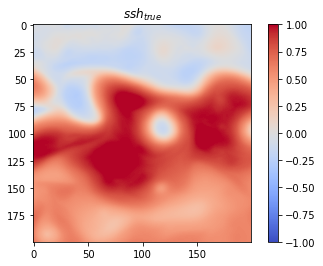

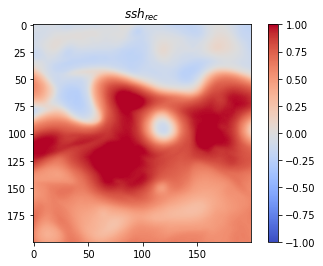

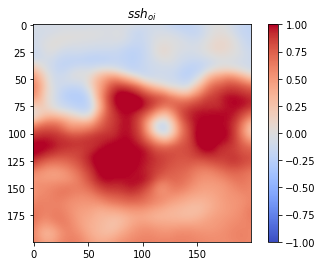

In [11]:
ssh_max = 1.
gssh_max = 0.25

plt.figure(1)
imgplot = plt.imshow( np.flipud(ssh_gt_tt) ,vmin=-ssh_max,vmax=ssh_max)
imgplot.set_cmap('coolwarm')
plt.colorbar()
plt.title('$ssh_{true}$')


plt.figure(2)
imgplot = plt.imshow( np.flipud(ssh_rec_tt) ,vmin=-ssh_max,vmax=ssh_max)
imgplot.set_cmap('coolwarm')
plt.colorbar()
plt.title('$ssh_{rec}$')

plt.figure(3)
imgplot = plt.imshow( np.flipud(ssh_oi_tt) ,vmin=-ssh_max,vmax=ssh_max)
imgplot.set_cmap('coolwarm')
plt.colorbar()
plt.title('$ssh_{oi}$')



mse_ssh = np.mean((ssh_gt_tt-ssh_rec_tt)**2)
mse_oi = np.mean((ssh_gt_tt-ssh_oi_tt)**2)

print(".... MSE SSH OI : %.2e / %.2f%%"%(mse_oi,100.*(1.-mse_oi/np.var(ssh_gt_tt))))
print(".... MSE SSH : %.2e / %.2f%% / %.2f%%"%(mse_ssh,100.*(1.-mse_ssh/np.var(ssh_gt_tt)) ,100.*(1.-mse_ssh/mse_oi)))


Text(0.5, 1.0, 'obs residual')

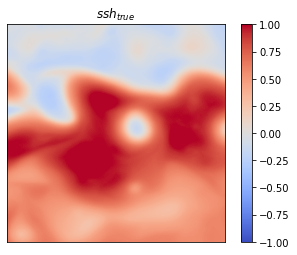

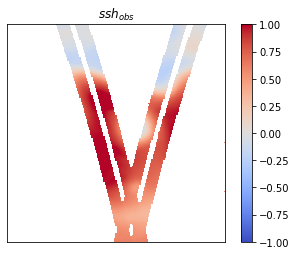

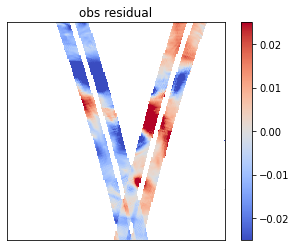

In [12]:
ssh_max = 1.
gssh_max = 0.25
savefig = False#True#

fig = plt.figure(1)
imgplot = plt.imshow( np.flipud(ssh_gt_tt) ,vmin=-ssh_max,vmax=ssh_max)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)
plt.colorbar()
if savefig == True :
    fig.set_size_inches(16, 12)
    fig.savefig('/tmp/ssh_true_d%02d.png'%(tt+1),dpi=100)
else:
    plt.title('$ssh_{true}$')
    
fig= plt.figure(2)
imgplot = plt.imshow( np.flipud(ssh_obs_tt) ,vmin=-ssh_max,vmax=ssh_max)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)

plt.colorbar()
if savefig == True :
    fig.set_size_inches(16, 12)
    fig.savefig('/tmp/ssh_obs_d%02d.png'%(tt+1),dpi=100)
else:
    plt.title('$ssh_{obs}$')

plt.figure(3)
imgplot = plt.imshow( np.flipud(ssh_gt_tt-ssh_obs_tt) ,vmin=-0.025,vmax=0.025)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)

plt.colorbar()
plt.title('obs residual')

.... MSE SSH OI : 1.58e-03 / 98.97%
.... MSE SSH : 2.14e-04 / 99.86% / 86.47%
.... MSE gSSH : 7.96e-06 / 97.21%


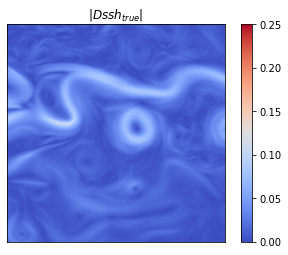

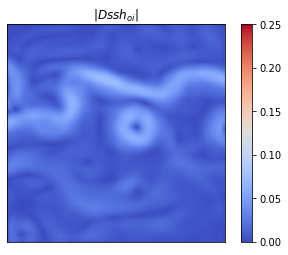

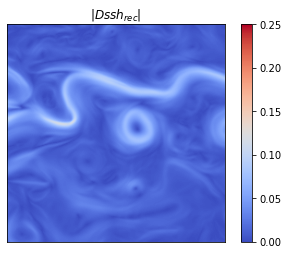

In [13]:
gssh_max = 0.25
ddu = 1.
ddv = 1.

gx,gy = np.gradient( ssh_gt_tt )
ng_ssh_gt_tt = np.sqrt( (ddv*gx)**2 + (ddu*gy)**2 )
gx,gy = np.gradient( ssh_rec_tt )
ng_ssh_rec_tt = np.sqrt( (ddv*gx)**2 + (ddu*gy)**2 )
gx,gy = np.gradient( ssh_oi_tt )
ng_ssh_oi_tt = np.sqrt( (ddv*gx)**2 + (ddu*gy)**2 )

fig= plt.figure(3)
imgplot = plt.imshow( np.flipud(ng_ssh_gt_tt) ,vmin=0,vmax=gssh_max)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)

plt.colorbar()
if savefig == True :
    fig.set_size_inches(16, 12)
    fig.savefig('/tmp/ssh_grad_true_d%02d.png'%(tt+1),dpi=100)
else:
    plt.title('$ \| D ssh_{true}\|$')

fig= plt.figure(4)
imgplot = plt.imshow( np.flipud(ng_ssh_oi_tt) ,vmin=0,vmax=gssh_max)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)

plt.colorbar()
if savefig == True :
    fig.set_size_inches(16, 12)
    fig.savefig('/tmp/ssh_grad_oi_d%02d.png'%(tt+1))
else:
    plt.title('$ \| D ssh_{oi}\|$')


fig= plt.figure(5)
imgplot = plt.imshow( np.flipud(ng_ssh_rec_tt) ,vmin=0,vmax=gssh_max)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)

plt.colorbar()
if savefig == True :
    fig.set_size_inches(16, 12)
    fig.savefig('/tmp/ssh_grad_4dvarnet_SLASST_d%02d.png'%(tt+1))
else:
    plt.title('$ \| D ssh_{rec}\|$')

mse_ssh = np.mean((ssh_gt_tt-ssh_rec_tt)**2)
mse_gssh = np.mean((ng_ssh_gt_tt-ng_ssh_rec_tt)**2)
mse_oi = np.mean((ssh_gt_tt-ssh_oi_tt)**2)

print(".... MSE SSH OI : %.2e / %.2f%%"%(mse_oi,100.*(1.-mse_oi/np.var(ssh_gt_tt))))
print(".... MSE SSH : %.2e / %.2f%% / %.2f%%"%(mse_ssh,100.*(1.-mse_ssh/np.var(ssh_gt_tt)) ,100.*(1.-mse_ssh/mse_oi)))
print(".... MSE gSSH : %.2e / %.2f%%"%(mse_gssh,100.*(1.-mse_gssh/np.var(ng_ssh_gt_tt))))



...... MSE/R**2 Laplacian rec = 5.937e-08 / 93.253 / 0.97
...... MSE/R**2 Laplacian OI  = 3.479e-07 / 60.466 / 0.78


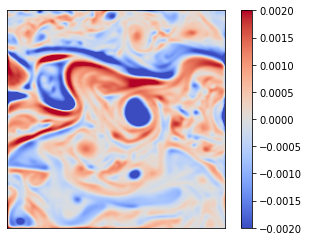

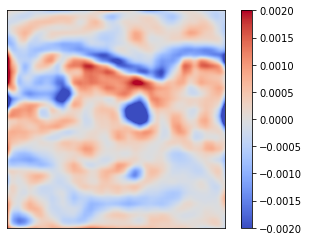

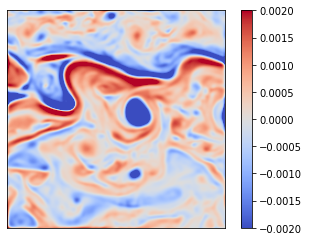

In [14]:
## Laplacian
def compute_laplacian(x):
    
    if len( x.shape ) == 2 :
        lap = x[1:-1,1:-1] 
        lap = lap - 0.25 * x[1:-1,0:x.shape[0]-2]
        lap = lap - 0.25 * x[1:-1,2:x.shape[0]]
        lap = lap - 0.25 * x[0:x.shape[0]-2,1:-1]
        lap = lap - 0.25 * x[2:x.shape[0],1:-1]
    else:
        lap = x[:,1:-1,1:-1] 
        lap = lap - 0.25 * x[:,1:-1,0:x.shape[0]-2]
        lap = lap - 0.25 * x[:,1:-1,2:x.shape[0]]
        lap = lap - 0.25 * x[:,0:x.shape[0]-2,1:-1]
        lap = lap - 0.25 * x[:,2:x.shape[0],1:-1]

    
    return lap

sig_lap = 1.5
lap_ssh_gt_tt = compute_laplacian( gaussian_filter(ssh_gt_tt, sigma=sig_lap))
lap_ssh_rec_tt = compute_laplacian( gaussian_filter(ssh_rec_tt, sigma=sig_lap))
lap_ssh_oi_tt = compute_laplacian( gaussian_filter(ssh_oi_tt, sigma=sig_lap) )

fig= plt.figure(0)
imgplot = plt.imshow( np.flipud(lap_ssh_gt_tt[:,:].squeeze()) ,vmin=-2e-3,vmax=2e-3)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)
plt.colorbar()
if savefig == True :
    fig.set_size_inches(16, 12)
    fig.savefig('/tmp/ssh_lap_true_d%02d.png'%(tt+1),dpi=100)



fig= plt.figure(1)
imgplot = plt.imshow( np.flipud(lap_ssh_oi_tt[:,:].squeeze()) ,vmin=-2e-3,vmax=2e-3)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)
plt.colorbar()
if savefig == True :
    fig.set_size_inches(16, 12)
    fig.savefig('/tmp/ssh_lap_oi_d%02d.png'%(tt+1),dpi=100)


fig= plt.figure(2)
imgplot = plt.imshow( np.flipud(lap_ssh_rec_tt[:,:].squeeze()) ,vmin=-2e-3,vmax=2e-3)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)
plt.colorbar()
if savefig == True :
    fig.set_size_inches(16, 12)
    fig.savefig('/tmp/ssh_lap_rec_d%02d.png'%(tt+1),dpi=100)


mse_rec = np.mean( (lap_ssh_rec_tt - lap_ssh_gt_tt)**2 )
mse_oi = np.mean( (lap_ssh_oi_tt - lap_ssh_gt_tt)**2 )
var_lap = np.var( lap_ssh_gt_tt[:] )

R_ssh_lap_rec = np.corrcoef(lap_ssh_rec_tt.ravel(), lap_ssh_gt_tt.ravel())[0,1]
R_ssh_lap_oi = np.corrcoef(lap_ssh_oi_tt.ravel(), lap_ssh_gt_tt.ravel())[0,1]

print('...... MSE/R**2 Laplacian rec = %.3e / %.3f / %.2f'%(mse_rec,100. * (1.-mse_rec/var_lap),R_ssh_lap_rec))
print('...... MSE/R**2 Laplacian OI  = %.3e / %.3f / %.2f'%(mse_oi,100. * (1.-mse_oi/var_lap),R_ssh_lap_oi))

.....  R2 sst-ssh feature (0) = 0.803
.....  R2 sst-ssh feature (1) = 0.692
.....  R2 sst-ssh feature (2) = -0.046
.....  R2 sst-ssh feature (3) = 0.839
.....  R2 sst-ssh feature (4) = 0.799
.....  R2 sst-ssh feature (5) = -0.378
.....  R2 sst-ssh feature (6) = 0.490
.....  R2 sst-ssh feature (7) = 0.847
.....  R2 sst-ssh feature (8) = -0.007
.....  R2 sst-ssh feature (9) = 0.522
.....  R2 sst-ssh feature (10) = 0.339
.....  R2 sst-ssh feature (11) = 0.709
.....  R2 sst-ssh feature (12) = 0.875
.....  R2 sst-ssh feature (13) = 0.779
.....  R2 sst-ssh feature (14) = 0.496
.....  R2 sst-ssh feature (15) = 0.288
.....  R2 sst-ssh feature (16) = 0.874
.....  R2 sst-ssh feature (17) = 0.399
.....  R2 sst-ssh feature (18) = 0.822


<ipython-input-15-130dc1dfb882>:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig= plt.figure(kk+1)


.....  R2 sst-ssh feature (19) = 0.540


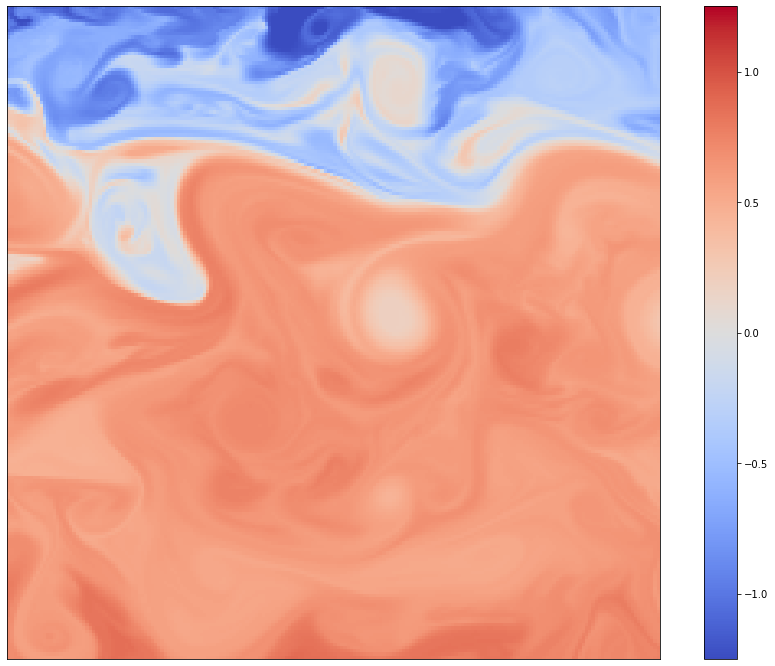

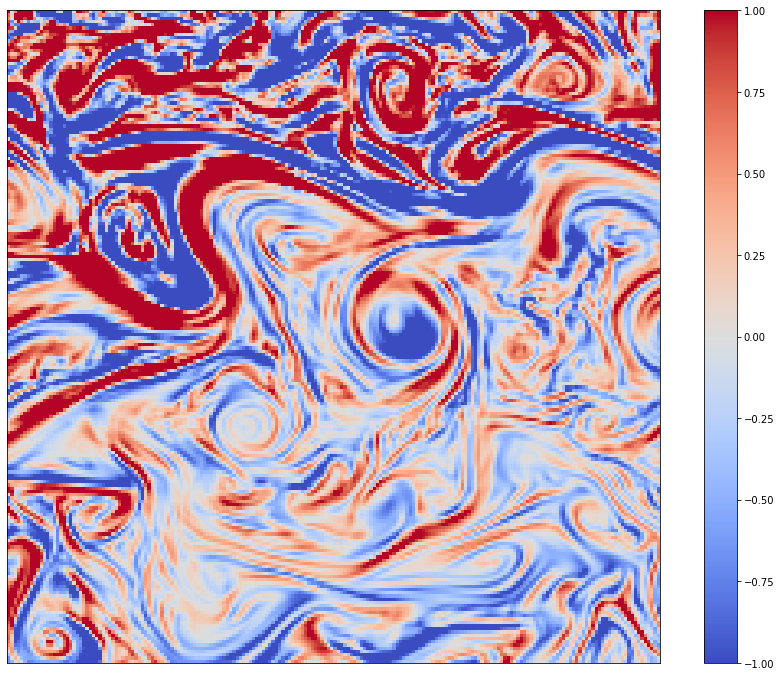

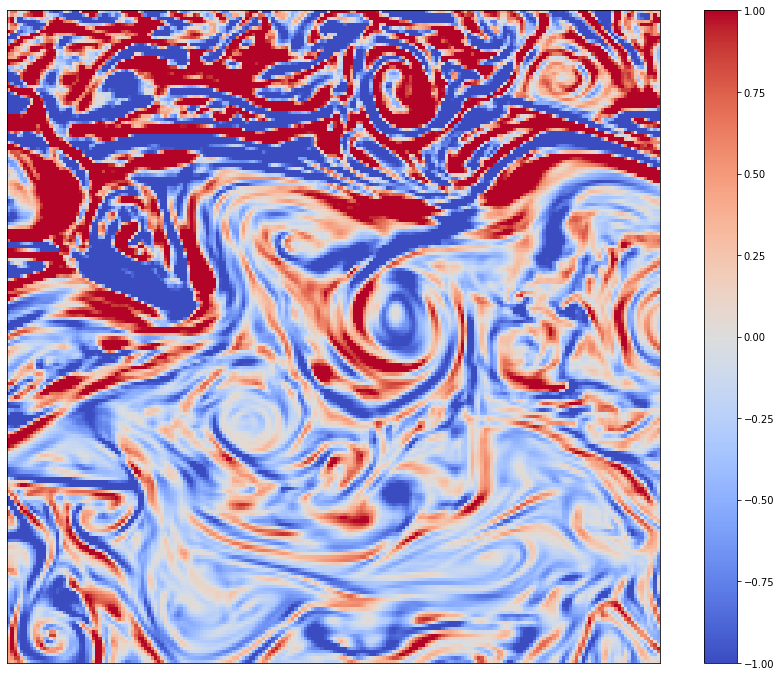

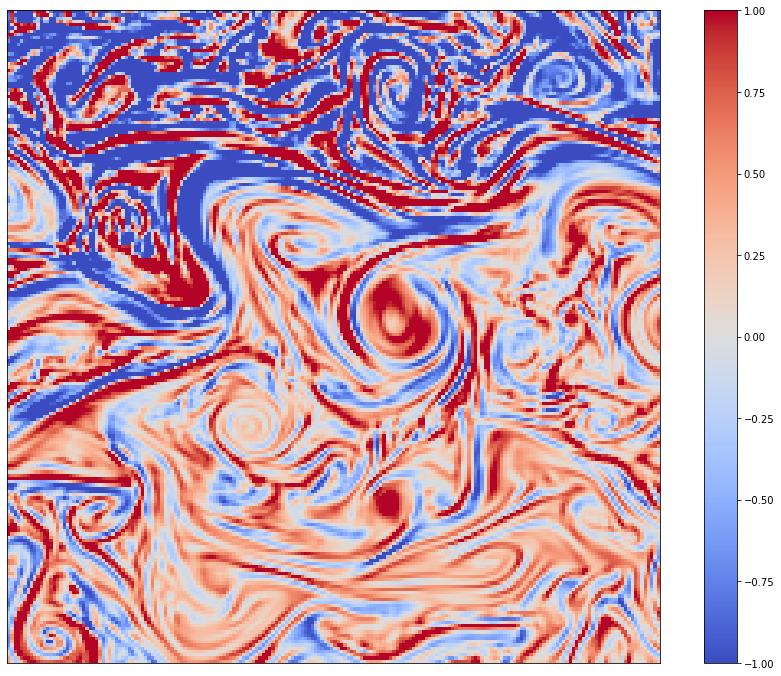

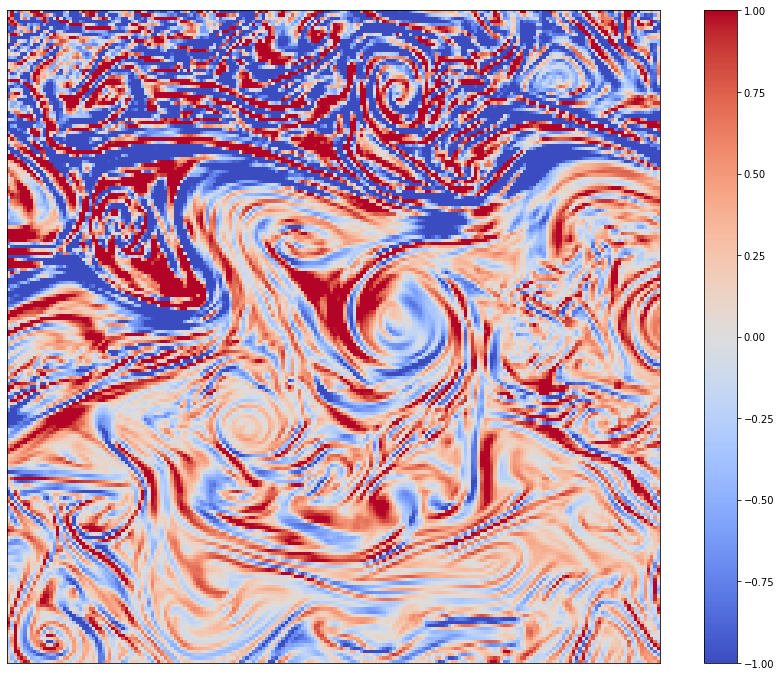

...

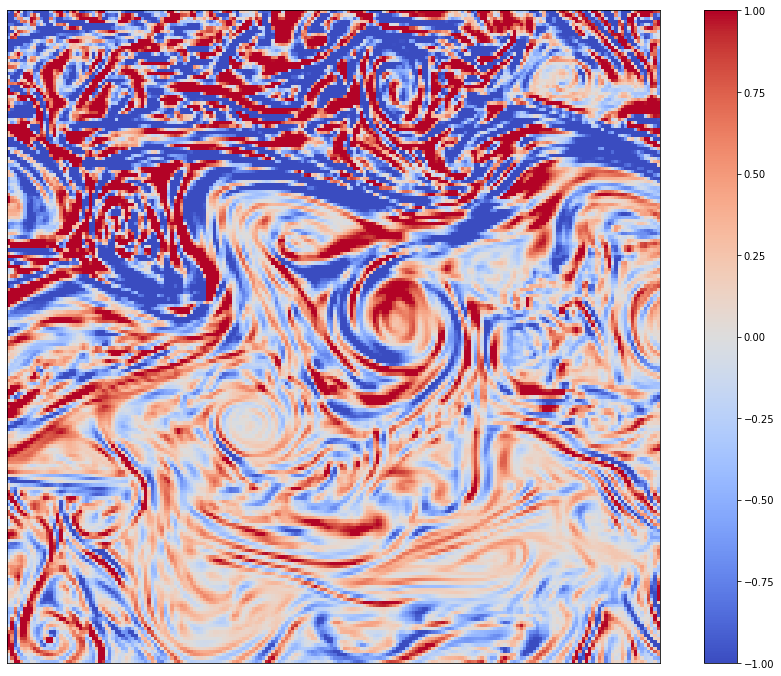

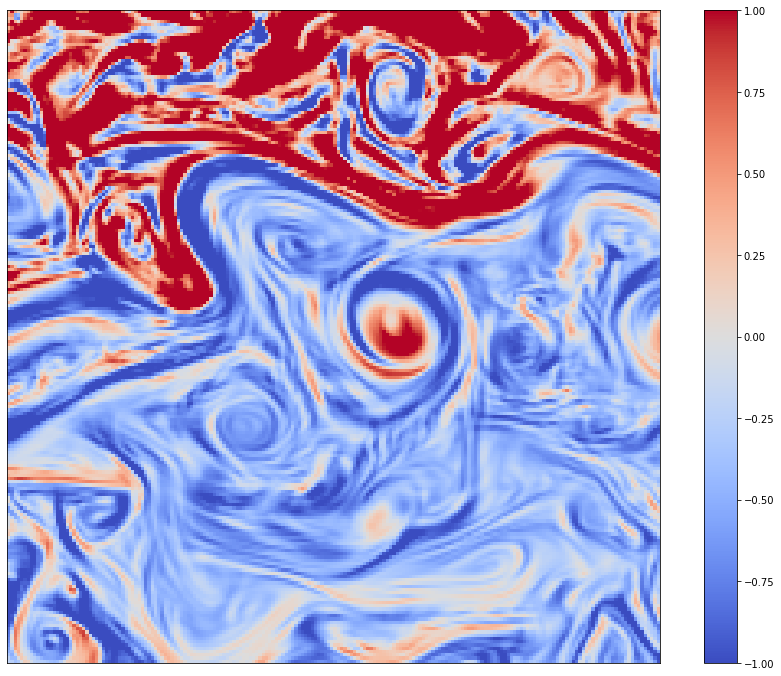

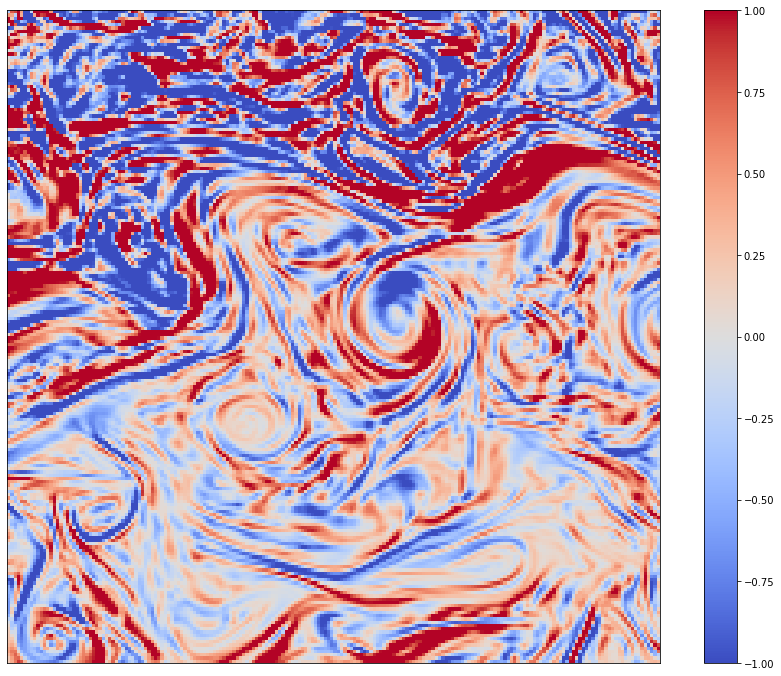

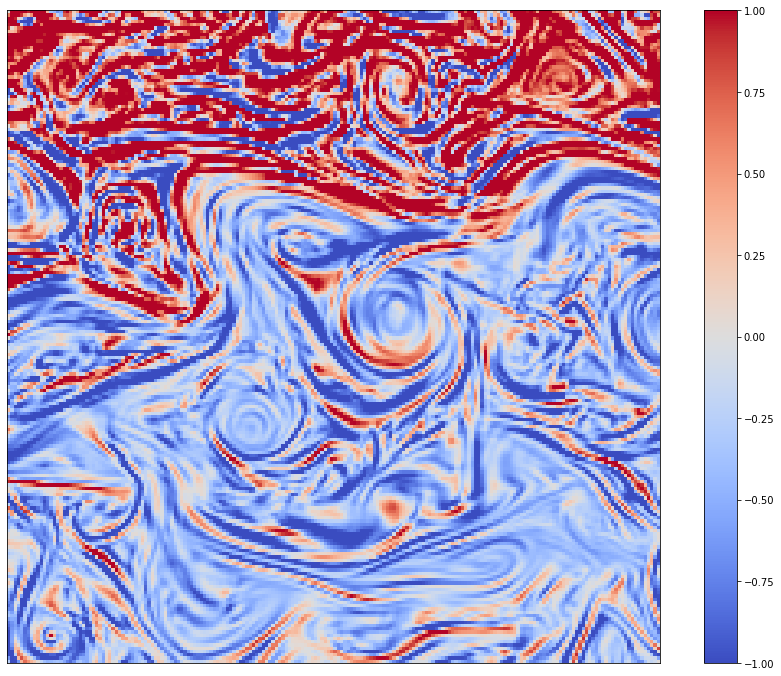

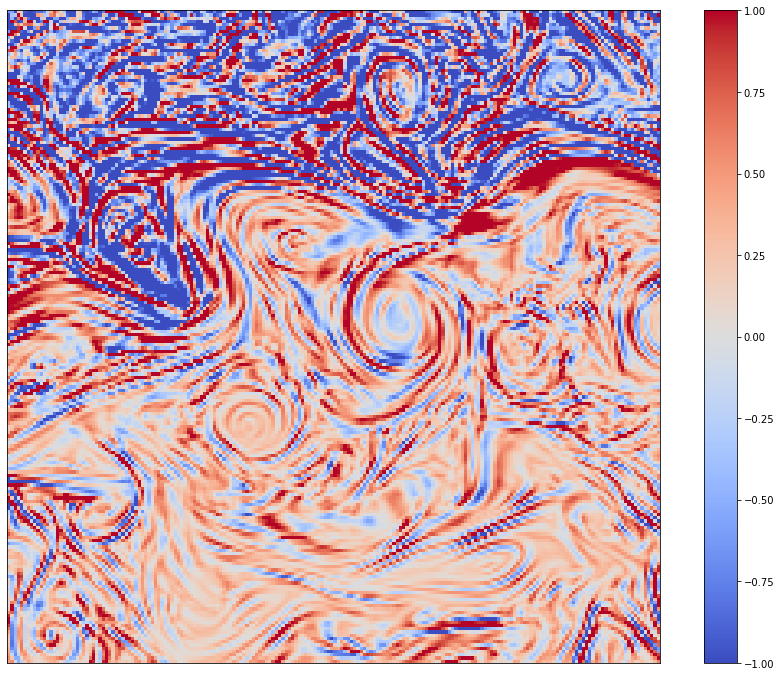

In [15]:
ssh_max = 1.
gssh_max = 0.25
savefig = True #False#


indSST = np.arange(10)#[0,1,2,5]

nb_feat_sst = int( sst_feat_tt.shape[0]/2 )

fig= plt.figure(0)
imgplot = plt.imshow( np.flipud(sst_feat_tt[0,:,:].squeeze()) ,vmin=-1.25,vmax=1.25)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)

plt.colorbar()
if savefig == True :
    fig.set_size_inches(16, 12)
    fig.savefig('/tmp/sst_d%02d.png'%(tt+1),dpi=100)

for kk in range(0,nb_feat_sst):
    fig= plt.figure(kk+1)
    imgplot = plt.imshow( np.flipud(sst_feat_tt[kk+1,:,:].squeeze()) ,vmin=-1.,vmax=1.)
    imgplot.set_cmap('coolwarm')
    ax = plt.gca()
    ax.axes.xaxis.set_ticklabels([])
    ax.axes.yaxis.set_ticklabels([])
    plt.tick_params(left = False)
    plt.tick_params(bottom = False)

    plt.colorbar()
    if savefig == True :
        fig.set_size_inches(16, 12)
        fig.savefig('/tmp/sst_feat_d%02d_%02d.png'%(tt+1,kk+1),dpi=100)

    R_sst_ssh_feat = np.corrcoef(sst_feat_tt[kk+1,:,:].ravel(), sst_feat_tt[nb_feat_sst+kk+1,:,:].ravel())[0,1]

    print('.....  R2 sst-ssh feature (%d) = %.3f'%(kk,R_sst_ssh_feat))


#for kk in range(0,2):
#    fig= plt.figure(kk)
#    imgplot = plt.imshow( np.flipud(sst_feat_tt[indSST[kk],:,:].squeeze()) ,vmin=-1.25,vmax=1.25)
#    imgplot.set_cmap('coolwarm')
#    plt.colorbar()
    #fig.set_size_inches(16, 12)
    #fig.savefig('/tmp/sst_feat_%d.png'%kk,dpi=100)





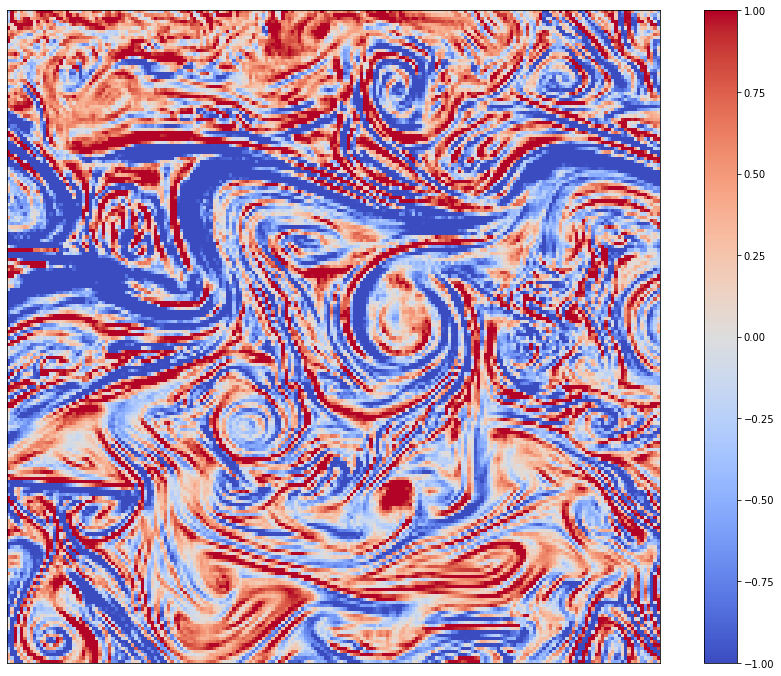

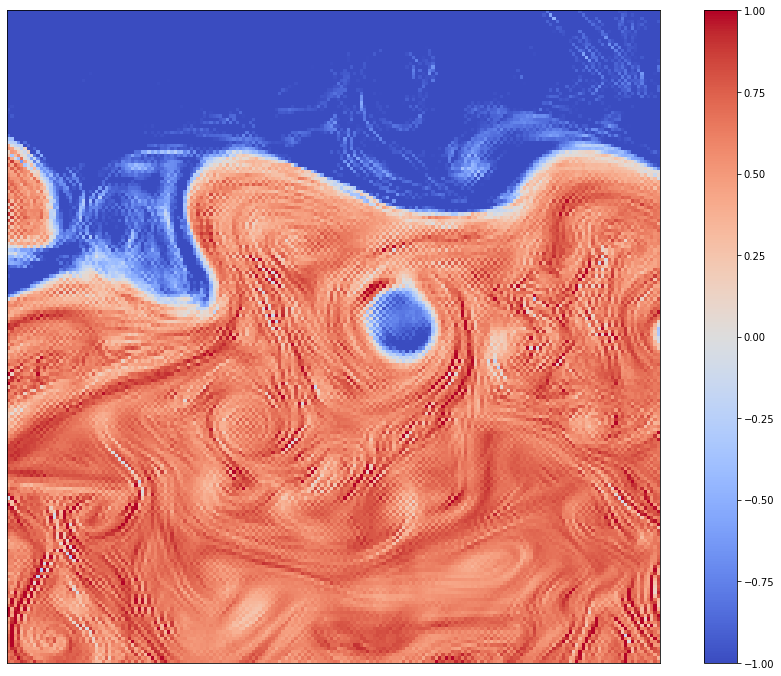

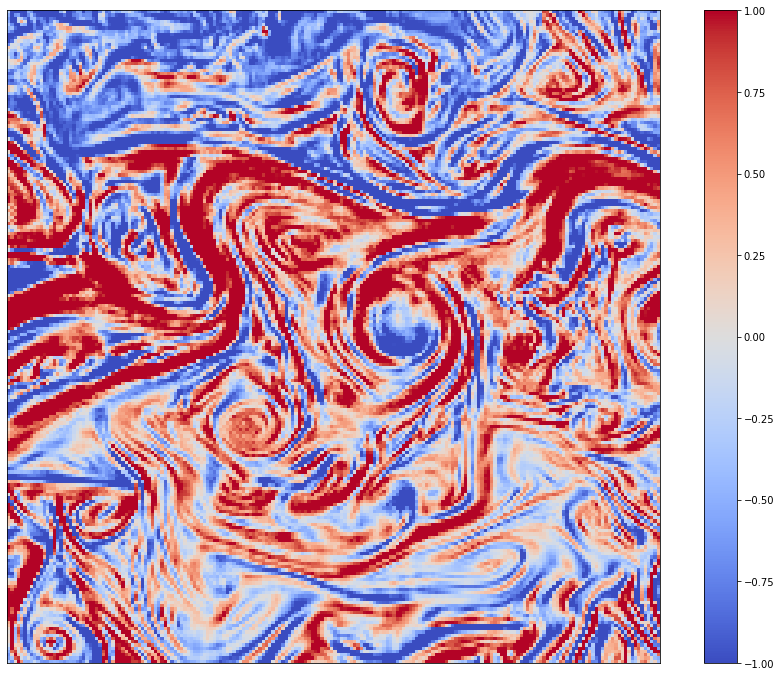

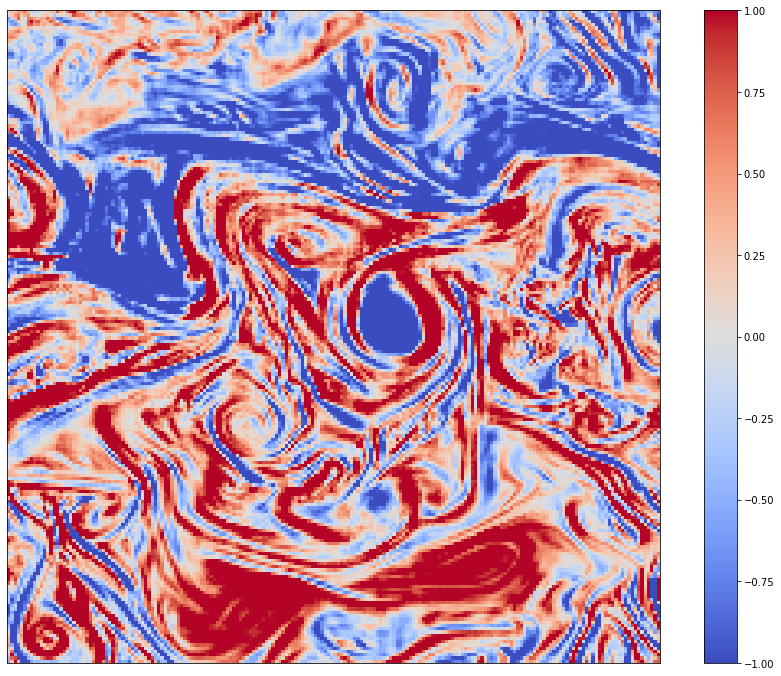

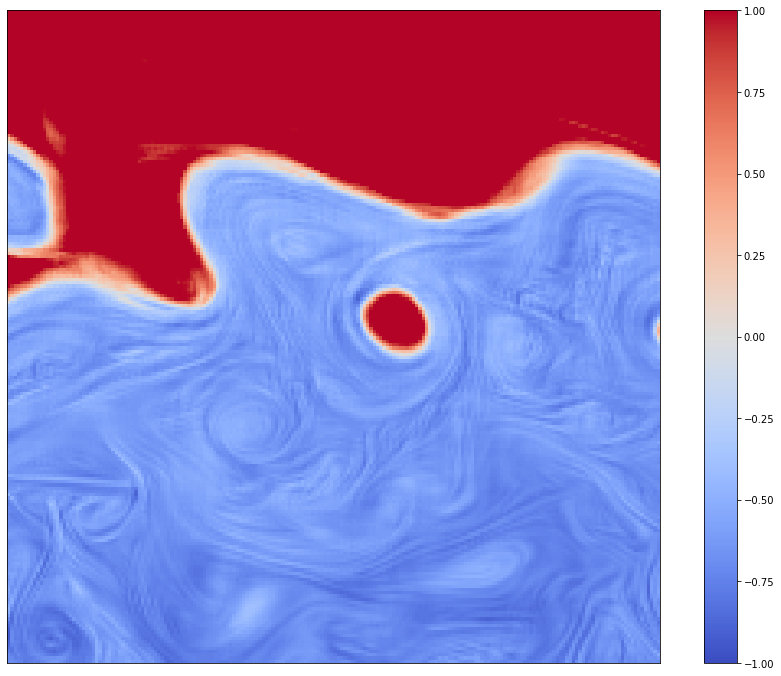

...

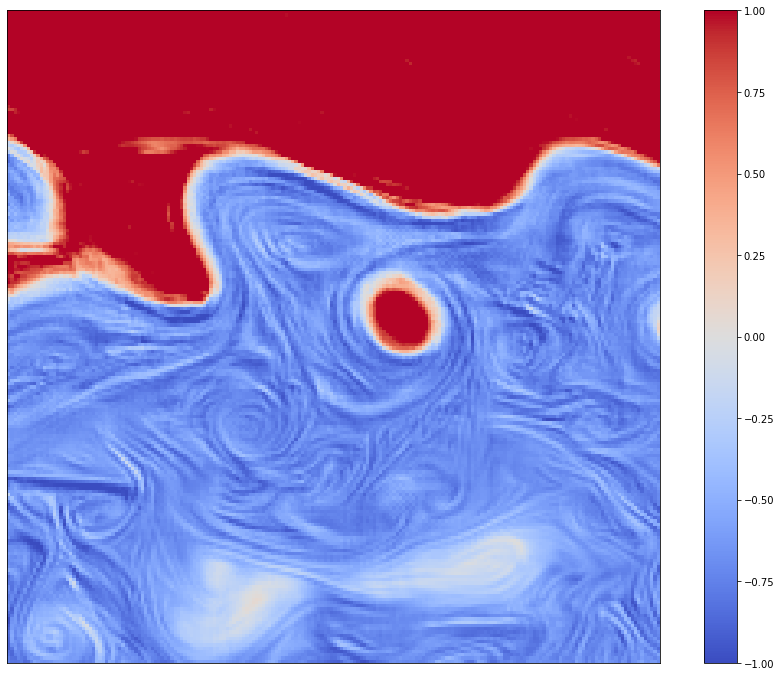

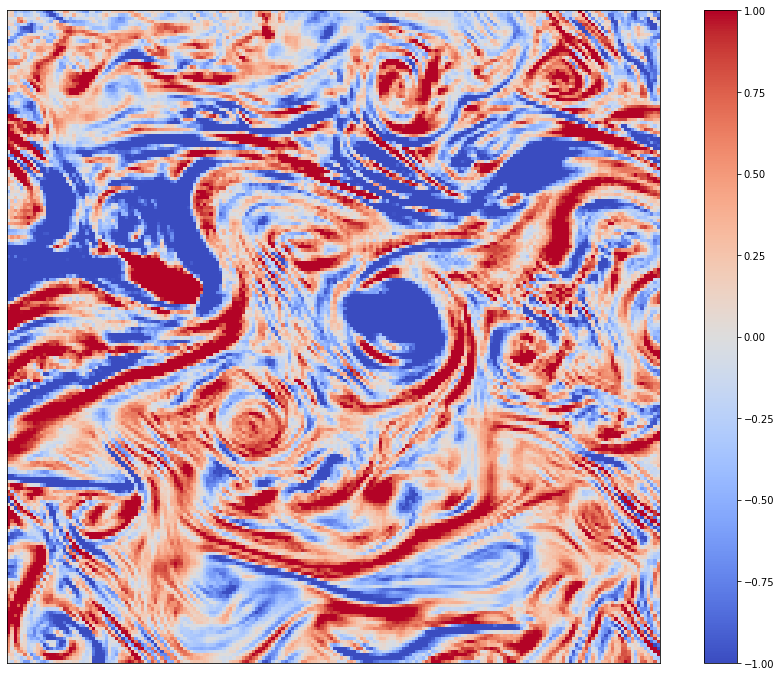

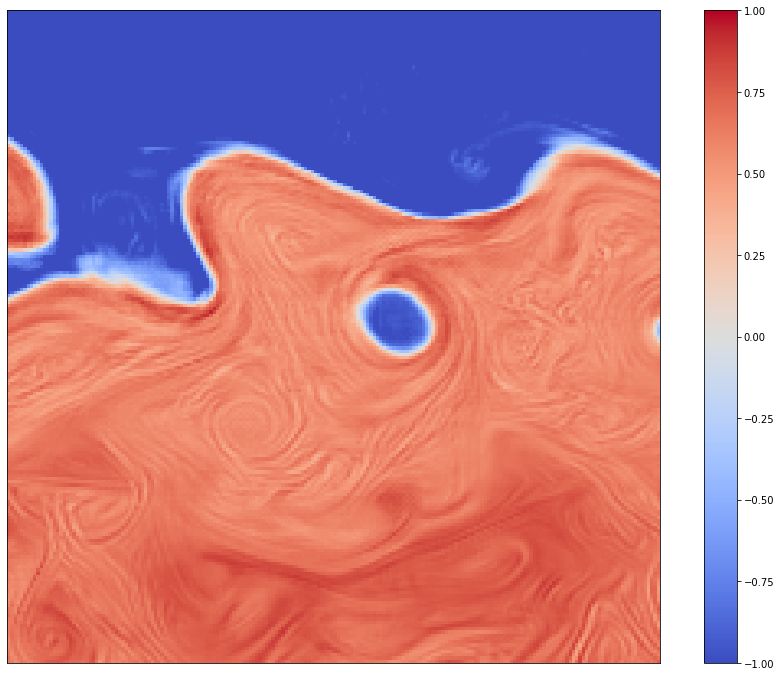

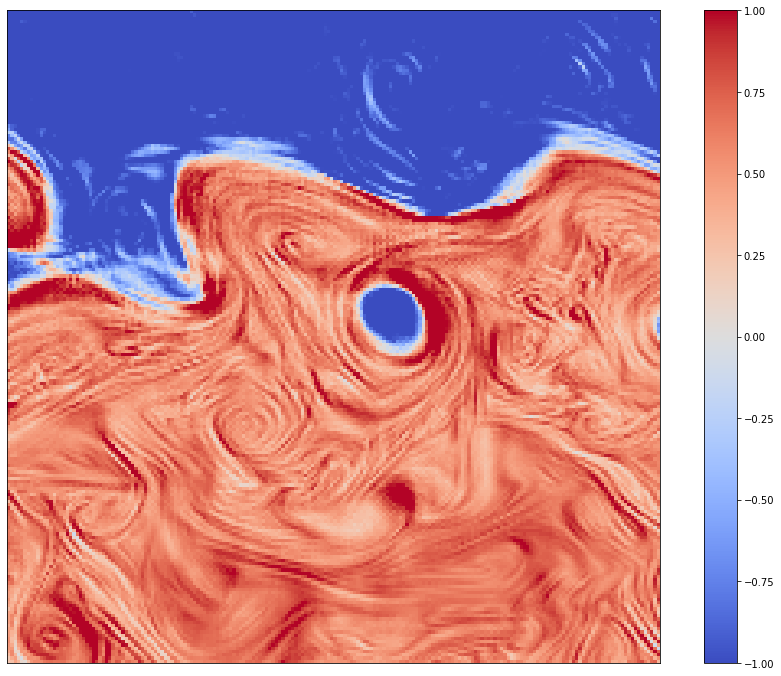

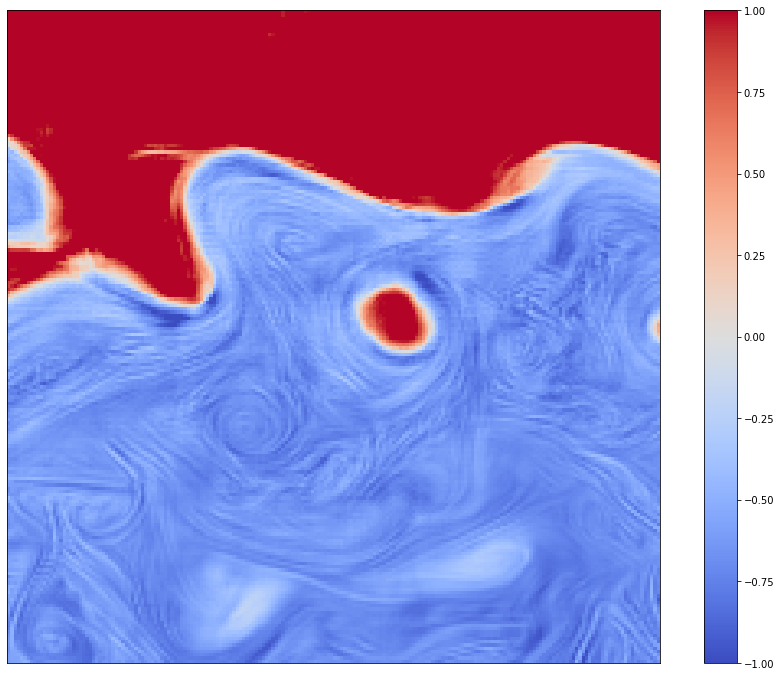

In [ ]:
for kk in range(nb_feat_sst,2*nb_feat_sst):
    fig= plt.figure(kk+1)
    imgplot = plt.imshow( np.flipud(sst_feat_tt[kk+1,:,:].squeeze()) ,vmin=-1.,vmax=1.)
    imgplot.set_cmap('coolwarm')
    ax = plt.gca()
    ax.axes.xaxis.set_ticklabels([])
    ax.axes.yaxis.set_ticklabels([])
    plt.tick_params(left = False)
    plt.tick_params(bottom = False)

    plt.colorbar()
    if savefig == True :
        fig.set_size_inches(16, 12)
        fig.savefig('/tmp/ssh_feat_d%02d_%02d.png'%((tt+1),kk+1),dpi=100)



.....  R2 sst-ssh feature (2) = 0.816 -- 0.394


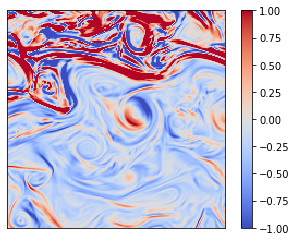

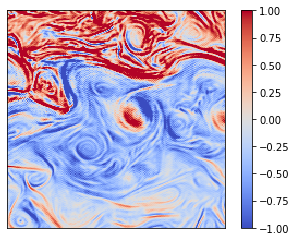

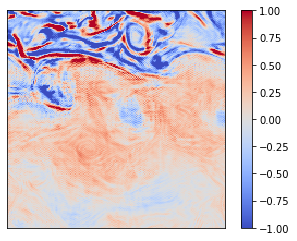

In [ ]:
kk = 2

fig= plt.figure(kk+1)
imgplot = plt.imshow( np.flipud((sst_feat_tt[kk+1,:,:]).squeeze()) ,vmin=-1.,vmax=1.)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)
plt.colorbar()

fig= plt.figure(kk+2)
imgplot = plt.imshow( np.flipud((sst_feat_tt[nb_feat_sst+kk+1,:,:]).squeeze()) ,vmin=-1.,vmax=1.)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)
plt.colorbar()

fig= plt.figure(kk+3)
imgplot = plt.imshow( np.flipud((sst_feat_tt[kk+1,:,:]-sst_feat_tt[nb_feat_sst+kk+1,:,:]).squeeze()) ,vmin=-1.,vmax=1.)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)
plt.colorbar()

R_sst_ssh_feat = np.corrcoef(sst_feat_tt[kk+1,:,:].ravel(), sst_feat_tt[nb_feat_sst+kk+1,:,:].ravel())[0,1]
nmse_sst_ssh_feat = np.mean( (sst_feat_tt[kk+1,:,:].ravel() - sst_feat_tt[nb_feat_sst+kk+1,:,:].ravel())**2 )
nmse_sst_ssh_feat = nmse_sst_ssh_feat / ( np.std( sst_feat_tt[kk+1,:,:]) * np.std( sst_feat_tt[nb_feat_sst+kk+1,:,:]) ) 

print('.....  R2 sst-ssh feature (%d) = %.3f -- %.3f'%(kk,R_sst_ssh_feat,nmse_sst_ssh_feat))

if 1*0 :
    for kk in range(0,nb_feat_sst):
        fig= plt.figure(kk+1)
        imgplot = plt.imshow( np.flipud((sst_feat_tt[kk+1,:,:]-sst_feat_tt[nb_feat_sst+kk+1,:,:]).squeeze()) )#,vmin=-1.,vmax=1.)
        imgplot.set_cmap('coolwarm')
        ax = plt.gca()
        ax.axes.xaxis.set_ticklabels([])
        ax.axes.yaxis.set_ticklabels([])
        plt.tick_params(left = False)
        plt.tick_params(bottom = False)

        plt.colorbar()
        if savefig == True :
            fig.set_size_inches(16, 12)
            fig.savefig('/tmp/ssh_feat_d%02d_%02d.png'%(tt,kk+1),dpi=100)

In [ ]:
# correlation statistics 
R_ssh_oi = np.corrcoef(ssh_gt_tt.ravel(), ssh_oi_tt.ravel())[0,1]
R_ssh_rec = np.corrcoef(ssh_gt_tt.ravel(), ssh_rec_tt.ravel())[0,1]

print(" R SSH NN = %f "%(R_ssh_rec))
print(" R SSH OI = %f "%(R_ssh_oi))

 R SSH NN = 0.999035 
 R SSH OI = 0.994874 


Text(0.5, 1.0, 'pdf ssh')

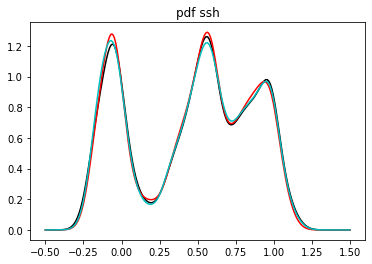

In [ ]:
from sklearn.neighbors import KernelDensity

# instantiate and fit the KDE model
kde = KernelDensity(bandwidth=0.05, kernel='gaussian')
x_ = np.linspace(-0.5,1.5,200)

# score_samples returns the log of the probability density
kde.fit(ssh_gt_tt.ravel()[:,None])
logprob_ssh_gt = kde.score_samples(x_[:,None])

kde.fit(ssh_oi_tt.ravel()[:,None])
logprob_ssh_oi = kde.score_samples(x_[:,None])

kde.fit(ssh_rec_tt.ravel()[:,None])
logprob_ssh_rec = kde.score_samples(x_[:,None])


plt.figure(1)
plt.plot(x_, np.exp(logprob_ssh_gt) , 'k-', markeredgewidth=1)
plt.plot(x_, np.exp(logprob_ssh_oi) , 'r-', markeredgewidth=1)
plt.plot(x_, np.exp(logprob_ssh_rec) , 'c-', markeredgewidth=1)
#plt.legend({'true','ssh-true','oi','geo-rec','rec'})
#plt.show()
plt.title('pdf ssh')


(-10, 10)

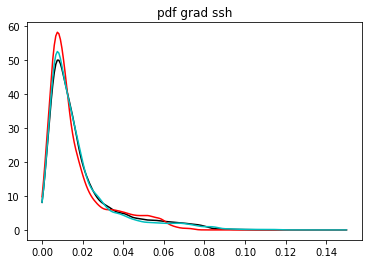

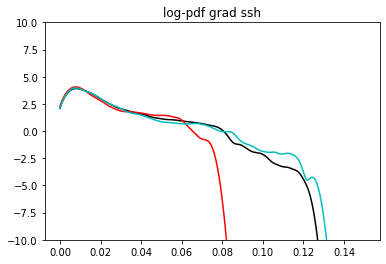

In [ ]:
from sklearn.neighbors import KernelDensity

# instantiate and fit the KDE model
kde = KernelDensity(bandwidth=0.002, kernel='gaussian')

# score_samples returns the log of the probability density
x_ = np.linspace(0.0,0.15,200)
kde.fit(ng_ssh_gt_tt.ravel()[:,None])
logprob_ng_ssh_gt = kde.score_samples(x_[:,None])

kde.fit(ng_ssh_oi_tt.ravel()[:,None])
logprob_ng_ssh_oi = kde.score_samples(x_[:,None])

kde.fit(ng_ssh_rec_tt.ravel()[:,None])
logprob_ng_ssh_rec = kde.score_samples(x_[:,None])

plt.figure(1)
plt.plot(x_, np.exp(logprob_ng_ssh_gt) , 'k-', markeredgewidth=3)
plt.plot(x_, np.exp(logprob_ng_ssh_oi) , 'r-', markeredgewidth=1)
plt.plot(x_, np.exp(logprob_ng_ssh_rec) , 'c-', markeredgewidth=1)
plt.title('pdf grad ssh')


plt.figure(2)



plt.plot(x_, logprob_ng_ssh_gt , 'k-', markeredgewidth=3)
plt.plot(x_, logprob_ng_ssh_oi , 'r-', markeredgewidth=1)
plt.plot(x_, logprob_ng_ssh_rec , 'c-', markeredgewidth=1)
plt.title('log-pdf grad ssh')
plt.ylim([-10,10])

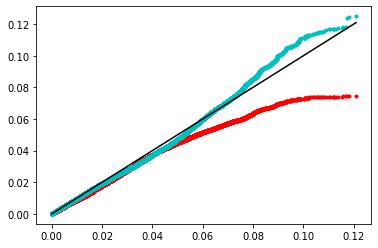

In [ ]:
s_gt = np.sort(ng_ssh_gt_tt.ravel())
s_rec = np.sort(ng_ssh_rec_tt.ravel())
s_oi = np.sort(ng_ssh_oi_tt.ravel())


i_s_gt = np.argsort(ng_ssh_gt_tt.ravel())
i_s_rec = np.argsort(ng_ssh_rec_tt.ravel())
i_s_oi = np.argsort(ng_ssh_oi_tt.ravel())


#s_rec.data
plt.figure()
plt.plot(s_gt.data,s_oi.data,'r.')
plt.plot(s_gt.data,s_rec.data,'c.')
plt.plot(np.array([s_gt.data[0],s_gt.data[-1]]),np.array([s_gt.data[0],s_gt.data[-1]]),'k-')

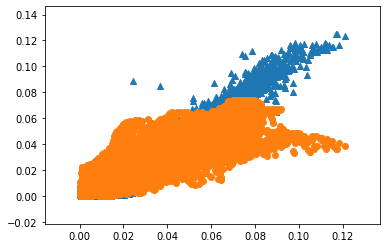

In [ ]:
plt.figure(5)
plt.scatter(ng_ssh_gt_tt[:][:,None], ng_ssh_rec_tt[:][:,None],marker='^')
plt.scatter(ng_ssh_gt_tt[:][:,None], ng_ssh_oi_tt[:][:,None],marker='o')

In [ ]:
from scipy.ndimage import gaussian_filter

# div/curl true fields
def compute_div_curl(u,v,ddu=1.,ddv=1.):
    gv_u,gu_u = np.gradient( u )
    gv_v,gu_v = np.gradient( v )

    gv_u = ddv * gv_u
    gu_u = ddu * gu_u
    gv_v = ddv * gv_v
    gu_v = ddu * gu_v

    div_uv = gu_u + gv_v
    curl_uv = gv_u - gu_v

    return div_uv,curl_uv

def compute_ssh2uv(ssh,a_u=1.,a_v=1.):
    ssh_dv ,ssh_du = np.gradient(ssh) 

    u = -1 * a_v * ssh_dv
    v = a_u * ssh_du
    
    return u,v

sig_curl_gt = 0.5
sig_curl_rec = 1.5
sig_curl_oi = 2.

ssh_gt_u_tt,ssh_gt_v_tt = compute_ssh2uv(ssh_gt_tt)
ssh_rec_u_tt,ssh_rec_v_tt = compute_ssh2uv(ssh_rec_tt)
ssh_oi_u_tt,ssh_oi_v_tt = compute_ssh2uv(ssh_oi_tt)

# div/curl from true/reconstructed ssh 


div_ssh_gt,curl_ssh_gt = compute_div_curl(gaussian_filter(ssh_gt_u_tt, sigma=sig_curl_gt) ,gaussian_filter(ssh_gt_v_tt, sigma=sig_curl_gt),ddu,ddv)
div_ssh_rec,curl_ssh_rec = compute_div_curl(gaussian_filter(ssh_rec_u_tt, sigma=sig_curl_rec),gaussian_filter(ssh_rec_v_tt, sigma=sig_curl_rec) ,ddu,ddv)
div_ssh_oi,curl_ssh_oi = compute_div_curl(gaussian_filter(ssh_oi_u_tt, sigma=sig_curl_oi) ,gaussian_filter(ssh_oi_v_tt, sigma=sig_curl_oi) ,ddu,ddv)

 R^2 curl SSH true/rec= 0.853921 
 R^2 curl SSH true/oi= 0.649245 


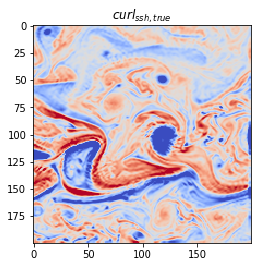

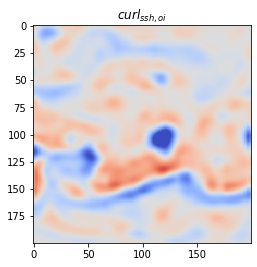

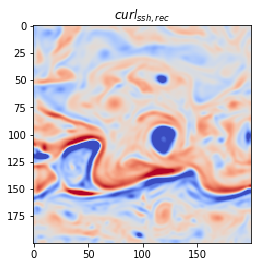

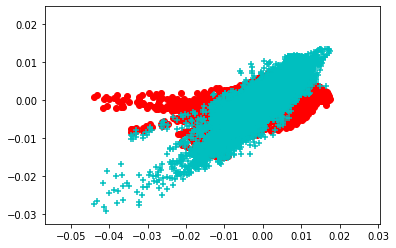

In [ ]:
curl_max = 0.01

plt.figure(1)
imgplot = plt.imshow( curl_ssh_gt ,vmin=-1.*curl_max,vmax=curl_max)
imgplot.set_cmap('coolwarm')
#plt.colorbar()
plt.title('$curl_{ssh,true}$')

plt.figure(2)
imgplot = plt.imshow( curl_ssh_oi ,vmin=-1.*curl_max,vmax=curl_max)
imgplot.set_cmap('coolwarm')
#plt.colorbar()
plt.title('$curl_{ssh,oi}$')

plt.figure(3)
imgplot = plt.imshow( curl_ssh_rec ,vmin=-1.*curl_max,vmax=curl_max)
imgplot.set_cmap('coolwarm')
plt.title('$curl_{ssh,rec}$')

# correlation statistics 
R_curl_ssh_rec = np.corrcoef(curl_ssh_rec.ravel(), curl_ssh_gt.ravel())[0,1]
R_curl_ssh_oi = np.corrcoef(curl_ssh_oi.ravel(), curl_ssh_gt.ravel())[0,1]


plt.figure()
plt.scatter(curl_ssh_gt.ravel(),curl_ssh_oi.ravel(),marker='o',c='r')
plt.scatter(curl_ssh_gt.ravel(),curl_ssh_rec.ravel(),marker='+',c='c')


print(" R^2 curl SSH true/rec= %f "%(R_curl_ssh_rec))
print(" R^2 curl SSH true/oi= %f "%(R_curl_ssh_oi))

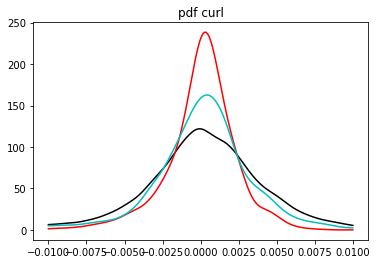

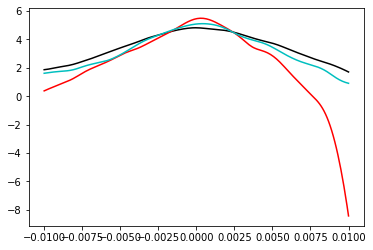

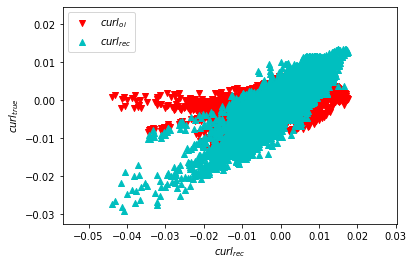

In [ ]:
#instantiate and fit the KDE model
kde = KernelDensity(bandwidth=0.0005, kernel='gaussian')

# score_samples returns the log of the probability density
x_ = np.linspace(-0.01,0.01,200)
kde.fit(curl_ssh_rec.ravel()[:,None])
logprob_curl_ssh_rec = kde.score_samples(x_[:,None])

kde.fit(curl_ssh_gt.ravel()[:,None])
logprob_curl_ssh_gt = kde.score_samples(x_[:,None])

kde.fit(curl_ssh_oi.ravel()[:,None])
logprob_curl_ssh_oi = kde.score_samples(x_[:,None])


plt.figure(1)
plt.plot(x_, np.exp(logprob_curl_ssh_gt) , 'k-', markeredgewidth=1)
plt.plot(x_, np.exp(logprob_curl_ssh_oi) , 'r-', markeredgewidth=1)
plt.plot(x_, np.exp(logprob_curl_ssh_rec) , 'c-', markeredgewidth=1)
#plt.legend({'ssh-true','ssh-oi','ssh-rec'})
plt.title('pdf curl')

plt.figure(2)
plt.plot(x_, (logprob_curl_ssh_gt) , 'k-', markeredgewidth=1)
plt.plot(x_, (logprob_curl_ssh_oi) , 'r-', markeredgewidth=1)
plt.plot(x_, (logprob_curl_ssh_rec) , 'c-', markeredgewidth=1)


plt.figure(4)
plt.scatter(curl_ssh_gt[:],curl_ssh_oi[:],marker='v',c='r')
plt.scatter(curl_ssh_gt[:],curl_ssh_rec[:],marker='^',c='c')
plt.ylabel('$curl_{true}$')
plt.xlabel('$curl_{rec}$')
plt.legend({'$curl_{oi}$','$curl_{rec}$'})
plt.show()

In [ ]:
import xarray as xr
import xrft

def psd_based_scores(ds_oi, ds_ref):
            
    # Compute error = SSH_reconstruction - SSH_true
    err = (ds_oi['sossheig'] - ds_ref['sossheig'])
    err = err.chunk({"lat":1, 'time': err['time'].size, 'lon': err['lon'].size})
    
    # make time vector in days units 
    err['time'] = (err.time - err.time[0]) #/ numpy.timedelta64(1, 'D')
    
    # Rechunk SSH_true
    signal = ds_ref['sossheig'].chunk({"lat":1, 'time': ds_ref['time'].size, 'lon': ds_ref['lon'].size})
    # make time vector in days units
    signal['time'] = (signal.time - signal.time[0]) #/ numpy.timedelta64(1, 'D')

    # Compute PSD_err and PSD_signal
    psd_err = xrft.power_spectrum(err, dim=['time', 'lon'], detrend='linear', window=True).compute()
    psd_signal = xrft.power_spectrum(signal, dim=['time', 'lon'], detrend='linear', window=True).compute()
    
    # Averaged over latitude
    mean_psd_signal = psd_signal.mean(dim='lat').where((psd_signal.freq_lon > 0.) & (psd_signal.freq_time > 0), drop=True)
    mean_psd_err = psd_err.mean(dim='lat').where((psd_err.freq_lon > 0.) & (psd_err.freq_time > 0), drop=True)
    
    # return PSD-based score
    psd_based_score = (1.0 - mean_psd_err/mean_psd_signal)

    # Find the key metrics: shortest temporal & spatial scales resolved based on the 0.5 contour criterion of the PSD_score 

    level = [0.5]
    
    cs = plt.contour(1./psd_based_score.freq_time.values,1./psd_based_score.freq_lon.values, psd_based_score, level)
    x05, y05 = cs.collections[0].get_paths()[0].vertices.T
    plt.close()
    
    shortest_spatial_wavelength_resolved = np.min(x05)
    shortest_temporal_wavelength_resolved = np.min(y05)

    return (1.0 - mean_psd_err/mean_psd_signal), np.round(shortest_spatial_wavelength_resolved, 3), np.round(shortest_temporal_wavelength_resolved, 3), np.round(shortest_temporal_wavelength_resolved, 2),mean_psd_signal,mean_psd_err
def rmse_based_scores(ds_oi, ds_ref):
    
    # RMSE(t) based score
    rmse_t = 1.0 - (((ds_oi['sossheig'] - ds_ref['sossheig'])**2).mean(dim=('lon', 'lat')))**0.5/(((ds_ref['sossheig'])**2).mean(dim=('lon', 'lat')))**0.5
    # RMSE(x, y) based score
    # rmse_xy = 1.0 - (((ds_oi['sossheig'] - ds_ref['sossheig'])**2).mean(dim=('time')))**0.5/(((ds_ref['sossheig'])**2).mean(dim=('time')))**0.5
    rmse_xy = (((ds_oi['sossheig'] - ds_ref['sossheig'])**2).mean(dim=('time')))**0.5
    
    rmse_t = rmse_t.rename('rmse_t')
    rmse_xy = rmse_xy.rename('rmse_xy')

    # Temporal stability of the error
    reconstruction_error_stability_metric = rmse_t.std().values

    # Show leaderboard SSH-RMSE metric (spatially and time averaged normalized RMSE)
    leaderboard_rmse = 1.0 - (((ds_oi['sossheig'] - ds_ref['sossheig']) ** 2).mean()) ** 0.5 / (
        ((ds_ref['sossheig']) ** 2).mean()) ** 0.5

    
    return rmse_t, rmse_xy, np.round(leaderboard_rmse.values, 3), np.round(reconstruction_error_stability_metric, 3)


In [ ]:
#import xarray as xr
ds_OI = xr.Dataset( {"sossheig": (["lat","lon", "time"], np.moveaxis(ssh_oi,0,-1))},
                coords={"lon": 1.0 / 20. * np.arange(0, ssh_oi.shape[1]),
                        "lat": 1.0 / 20. * np.arange(0, ssh_oi.shape[2]),
                        "time": np.arange(0,ssh_oi.shape[0]),
                        },)
ds_test = xr.Dataset( {"sossheig": (["lat","lon", "time"], np.moveaxis(ssh_gt,0,-1))},
                coords={"lon": 1.0 / 20. * np.arange(0, ssh_oi.shape[1]),
                        "lat": 1.0 / 20. * np.arange(0, ssh_oi.shape[2]),
                        "time": np.arange(0,ssh_oi.shape[0]),
                        },)
ds_rec = xr.Dataset( {"sossheig": (["lat","lon", "time"], np.moveaxis(ssh_rec,0,-1))},
                coords={"lon": 1.0 / 20. * np.arange(0, ssh_oi.shape[1]),
                        "lat": 1.0 / 20. * np.arange(0, ssh_oi.shape[2]),
                        "time": np.arange(0,ssh_oi.shape[0]),
                        },)

boost_swot_score_rmse_duacs = rmse_based_scores(ds_OI,ds_test )
boost_swot_score_rmse_rec = rmse_based_scores(ds_rec,ds_test )

boost_swot_score_psd_duacs = psd_based_scores(ds_OI,ds_test )
boost_swot_score_psd_rec = psd_based_scores(ds_rec,ds_test )

#boost_swot_score_psd_rec = psd_based_scores({'sossheig':mod.x_rec_ssh}, {'sossheig':X_test})
#boost_swot_score_rmse_rec = rmse_based_scores({'sossheig':mod.x_rec_ssh}, {'sossheig':X_test})

print('.... Boost swot RMSE scores ......')
print('.... OI mse scores       : mu = %f  --  sigma = %f '%(boost_swot_score_rmse_duacs[2],boost_swot_score_rmse_duacs[3]) )
print('.... 4DVarNet mse scores : mu = %f  --  sigma = %f '%(boost_swot_score_rmse_rec[2],boost_swot_score_rmse_rec[3]) )

print('.... Boost swot PSD scores ......')
print('.... OI mse scores       : lambda_t = %f  --  lambda_x = %f '%(boost_swot_score_psd_duacs[1],boost_swot_score_psd_duacs[2]) )
print('.... 4DVarNet mse scores : lambda_t = %f  --  lambda_x = %f '%(boost_swot_score_psd_rec[1],boost_swot_score_psd_rec[2]) )

/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/xrft/xrft.py:51: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  FutureWarning,
/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/xrft/xrft.py:51: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  FutureWarning,
/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/xrft/xrft.py:51: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  FutureWarning,
/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/xrft/xrft.py:51: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  FutureWarning,


.... Boost swot RMSE scores ......
.... OI mse scores       : mu = 0.921000  --  sigma = 0.017000 
.... 4DVarNet mse scores : mu = 0.959000  --  sigma = 0.007000 
.... Boost swot PSD scores ......
.... OI mse scores       : lambda_t = 11.052000  --  lambda_x = 1.226000 
.... 4DVarNet mse scores : lambda_t = 6.816000  --  lambda_x = 9.568000 


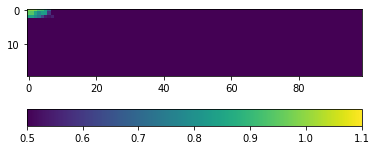

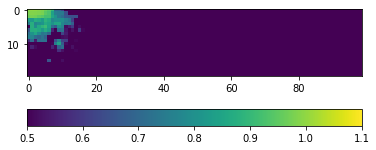

In [ ]:
# Visualisation

psd_score_duacs = 1.0 - boost_swot_score_psd_duacs[5] / boost_swot_score_psd_duacs[4]
psd_score_duacs = psd_score_duacs.transpose()
plt.figure(1)
plt.imshow(psd_score_duacs,vmin=0.5,vmax=1.1 )
plt.colorbar(orientation="horizontal")

psd_score_rec = 1.0 - boost_swot_score_psd_rec[5] / boost_swot_score_psd_rec[4]
psd_score_rec = psd_score_rec.transpose()
plt.figure(2)
plt.imshow(psd_score_rec,vmin=0.5,vmax=1.1 )
plt.colorbar(orientation="horizontal")

In [ ]:
import scipy.ndimage as nd

def imputing_nan(data, invalid=None):
    """
    Replace the value of invalid 'data' cells (indicated by 'invalid') 
    by the value of the nearest valid data cell
    """
    if invalid is None: invalid = np.isnan(data)
    ind = nd.distance_transform_edt(invalid, return_distances=False, return_indices=True)
    return data[tuple(ind)]

def cart2pol(x, y):
    rho = np.sqrt(x**2 + y**2)
    phi = np.arctan2(y, x)
    return(phi, rho)

def hanning2d(M, N):
    """
    A 2D hanning window, as per IDL's hanning function.  See numpy.hanning for the 1d description
    """

    if N <= 1:
        return np.hanning(M)
    elif M <= 1:
        return np.hanning(N) # scalar unity; don't window if dims are too small
    else:
        return np.outer(np.hanning(M),np.hanning(N))

def avg_rapsd2dv1(img3d,res,hanning):
    """ Computes and plots radially averaged power spectral density mean (power
     spectrum) of an image set img3d along the first dimension.
    """
    N = img3d.shape[0]
    for i in range(N):
        img=img3d[i,:,:]
        f_, Pf_ = rapsd2dv1(img,res,hanning)
        if i==0:
            f, Pf = f_, Pf_
        else:
            f = np.vstack((f,f_))
            Pf= np.vstack((Pf,Pf_))
    Pf = np.mean(Pf,axis=0)
    return f_, Pf

def avg_err_rapsd2dv1(img3d,img3dref,res,hanning):
    """ Computes and plots radially averaged power spectral density error mean (power
     spectrum) of an image set img3d along the first dimension.
    """
    n = img3d.shape[0]
    for i in range(n):
        img1 = img3d[i,:,:]
        img2 = img3dref[i,:,:]
        f_, pf_ = rapsd2dv1(img1-img2,res,hanning)
        pf_ = (pf_/rapsd2dv1(img2,res,hanning)[1])
        if i==0:
            f, pf = f_, pf_
        else:
            f = np.vstack((f,f_))
            pf= np.vstack((pf,pf_))
    pf = np.mean(pf,axis=0)
    return f_, pf


def err_rapsd2dv1(img,imgref,res,hanning):
    """ Computes and plots radially averaged power spectral density error (power
     spectrum).
    """
    f_, pf_ = rapsd2dv1(img-imgref,res,hanning)
    pf_     = (pf_/rapsd2dv1(imgref,res,hanning)[1])
    return f_, pf_

def rapsd2dv1(img,res,hanning,compute_mean=False):
    """ Computes and plots radially averaged power spectral density (power
     spectrum) of image IMG with spatial resolution RES.
    """
    img = img.copy()
    n, m = img.shape
    if hanning:
        img = hanning2d(*img.shape) * img
    img = imputing_nan(img)
    imgf = np.fft.fftshift(np.fft.fft2(img))
    imgfp = np.power(np.abs(imgf)/(n*m),2)
    # Adjust PSD size
    dim_diff = np.abs(n-m)
    dim_max = max(n,m)
    if (n>m):
        if ((dim_diff%2)==0):
            imgfp = np.pad(imgfp,((0,0),(int(dim_diff/2),int(dim_diff/2))),'constant',constant_values=np.nan)
        else:
            imgfp = np.pad(imgfp,((0,0),(int(dim_diff/2),1+int(dim_diff/2))),'constant',constant_values=np.nan)

    elif (n<m):
        if ((dim_diff%2)==0):
            imgfp = np.pad(imgfp,((int(dim_diff/2),int(dim_diff/2)),(0,0)),'constant',constant_values=np.nan)
        else:
            imgfp = np.pad(imgfp,((int(dim_diff/2),1+int(dim_diff/2)),(0,0)),'constant',constant_values=np.nan)
    half_dim = int(np.ceil(dim_max/2.))
    x, y = np.meshgrid(np.arange(-dim_max/2.,dim_max/2.-1+0.00001),np.arange(-dim_max/2.,dim_max/2.-1+0.00001))
    theta, rho = cart2pol(x, y)
    rho = np.round(rho+0.5)
    pf = np.zeros(half_dim)
    f1 = np.zeros(half_dim)
    for r in range(half_dim):
      if compute_mean == False:
          pf[r] = np.nansum(imgfp[rho == (r+1)])
      else:
          pf[r] = np.nanmean(imgfp[rho == (r+1)])                
      f1[r] = float(r+1)/dim_max
    f1 = f1/res
    return f1, pf

/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:54: RuntimeWarning: invalid value encountered in true_divide
/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in less_equal
/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in less_equal


..... Smalles resolverd scale (oi) : 1.250000
..... Smalles resolverd scale (rec) : 0.454545


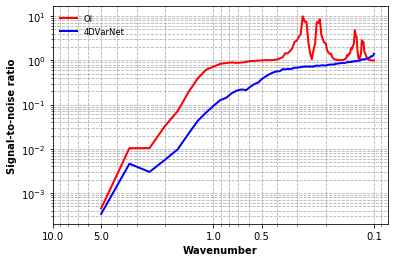

In [ ]:
dt = ssh_gt.shape[0]

# Compute Signal-to-Noise ratio
f, pf = avg_err_rapsd2dv1(ssh_oi,ssh_gt,1/20.,True)
wf = 1./f
snr_oi = [wf, pf]
f, pf = avg_err_rapsd2dv1(ssh_rec,ssh_gt,1/20.,True)
wf = 1./f
snr_pred = [wf, pf]

# plot Signal-to-Noise ratio
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(snr_oi[0],snr_oi[1],color='red',linewidth=2,label='OI')
ax.plot(snr_pred[0],snr_pred[1],color='blue',linewidth=2,label='4DVarNet')
ax.set_xlabel("Wavenumber", fontweight='bold')
ax.set_ylabel("Signal-to-noise ratio", fontweight='bold')
ax.set_xscale('log') ; ax.set_yscale('log')
plt.legend(loc='best',prop=dict(size='small'),frameon=False)
plt.xticks([0.1, 0.5, 1.0, 5.0, 10.0], ["0.1", "0.5", "1.0", "5.0", "10.0"])
#plt.xticks([50, 100, 200, 500, 1000], ["50km", "100km", "200km", "500km", "1000km"])
ax.invert_xaxis()
plt.grid(which='both', linestyle='--')


# finest scale above 0.5 in terms of snr
xscale_oi = np.min( wf[ np.where( snr_oi[1] <= 0.5 ) ] )
xscale_rec = np.min( wf[ np.where( snr_pred[1] <= 0.5) ] )

print('..... Smalles resolverd scale (oi) : %f'%xscale_oi)
print('..... Smalles resolverd scale (rec) : %f'%xscale_rec)



In [ ]:
snr_pred[1].shape
#wf.shape

(100,)

In [ ]:
ds_oi = ds_rec
ds_ref = ds_test
            
# Compute error = SSH_reconstruction - SSH_true
err = (ds_oi['sossheig'] - ds_ref['sossheig'])
err = err.chunk({"lat":1, 'time': err['time'].size, 'lon': err['lon'].size})

# make time vector in days units 
err['time'] = (err.time - err.time[0]) #/ numpy.timedelta64(1, 'D')

# Rechunk SSH_true
signal = ds_ref['sossheig'].chunk({"lat":1, 'time': ds_ref['time'].size, 'lon': ds_ref['lon'].size})
# make time vector in days units
signal['time'] = (signal.time - signal.time[0]) #/ numpy.timedelta64(1, 'D')

# Compute PSD_err and PSD_signal
psd_err = xrft.power_spectrum(err, dim=['time', 'lon'], detrend='linear', window=True).compute()
psd_signal = xrft.power_spectrum(signal, dim=['time', 'lon'], detrend='linear', window=True).compute()

# Averaged over latitude
mean_psd_signal = psd_signal.mean(dim='lat').where((psd_signal.freq_lon > 0.) & (psd_signal.freq_time > 0), drop=True)
mean_psd_err = psd_err.mean(dim='lat').where((psd_err.freq_lon > 0.) & (psd_err.freq_time > 0), drop=True)

# return PSD-based score
psd_based_score = (1.0 - mean_psd_err/mean_psd_signal)

# Find the key metrics: shortest temporal & spatial scales resolved based on the 0.5 contour criterion of the PSD_score 

level = [0.5]

cs = plt.contour(1./psd_based_score.freq_time.values,1./psd_based_score.freq_lon.values, psd_based_score, level)
x05, y05 = cs.collections[0].get_paths()[0].vertices.T
plt.close()

shortest_spatial_wavelength_resolved = np.min(x05)
shortest_temporal_wavelength_resolved = np.min(y05)

/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/xrft/xrft.py:51: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  FutureWarning,
/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/xrft/xrft.py:51: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  FutureWarning,


In [ ]:
mean_psd_err_spatial = 1. -  np.mean( mean_psd_err.values , axis = 1) / np.mean( mean_psd_signal.values , axis = 1)
print('.... spatial scale %f'%np.min( 1. / psd_signal.freq_lon[mean_psd_err_spatial.shape[0]+2:][ np.where( mean_psd_err_spatial >= 0.5 ) ] ) )

mean_psd_err_time = 1. - np.mean( mean_psd_err.values , axis = 0) / np.mean( mean_psd_signal.values , axis = 0)
print('.... time scale %f'%np.min( 1. / psd_signal.freq_time[mean_psd_err_time.shape[0]+2:][ np.where( mean_psd_err_time >= 0.5 ) ] ) )



.... spatial scale 0.769231
.... time scale 4.200000


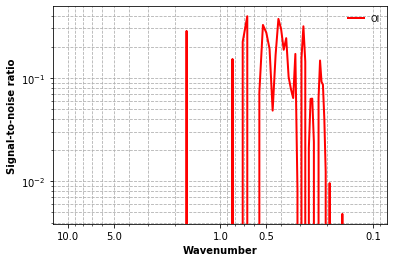

In [ ]:
ii = 19

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(1. / psd_signal.freq_lon[mean_psd_err_spatial.shape[0]+2:],1. -  mean_psd_err.values[:,ii] / mean_psd_signal.values[:,ii],color='red',linewidth=2,label='OI')
#ax.plot(snr_pred[0],snr_pred[1],color='blue',linewidth=2,label='4DVarNet')
ax.set_xlabel("Wavenumber", fontweight='bold')
ax.set_ylabel("Signal-to-noise ratio", fontweight='bold')
ax.set_xscale('log') ; ax.set_yscale('log')
plt.legend(loc='best',prop=dict(size='small'),frameon=False)
plt.xticks([0.1, 0.5, 1.0, 5.0, 10.0], ["0.1", "0.5", "1.0", "5.0", "10.0"])
#plt.xticks([50, 100, 200, 500, 1000], ["50km", "100km", "200km", "500km", "1000km"])
ax.invert_xaxis()
plt.grid(which='both', linestyle='--')



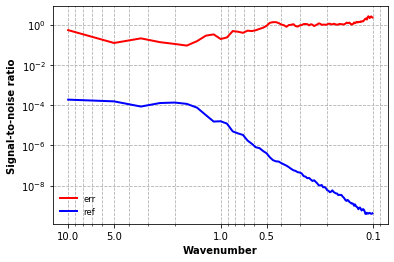

In [ ]:
ii = 5

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(1. / psd_signal.freq_lon[mean_psd_err_spatial.shape[0]+2:],mean_psd_err.values[:,ii] / mean_psd_signal.values[:,ii],color='red',linewidth=2,label='err')
ax.plot(1. / psd_signal.freq_lon[mean_psd_err_spatial.shape[0]+2:], mean_psd_signal.values[:,ii],color='blue',linewidth=2,label='ref')

#ax.plot(snr_pred[0],snr_pred[1],color='blue',linewidth=2,label='4DVarNet')
ax.set_xlabel("Wavenumber", fontweight='bold')
ax.set_ylabel("Signal-to-noise ratio", fontweight='bold')
ax.set_xscale('log') ; ax.set_yscale('log')
plt.legend(loc='best',prop=dict(size='small'),frameon=False)
plt.xticks([0.1, 0.5, 1.0, 5.0, 10.0], ["0.1", "0.5", "1.0", "5.0", "10.0"])
#plt.xticks([50, 100, 200, 500, 1000], ["50km", "100km", "200km", "500km", "1000km"])
ax.invert_xaxis()
plt.grid(which='both', linestyle='--')




In [ ]:
### SQG-based processing

### high-pass filtering applied to SST
niter_smoothing = 100
sig_smoothing = 1.
niter_smoothing_ano = 0

sst_gt_tt = sst_feat_tt[0,:,:]
s_sst_tt = sst_feat_tt[0,:,:]
for nn in range(0,niter_smoothing):
    s_sst_tt = gaussian_filter(s_sst_tt, sigma= sig_smoothing)
    
sst_ano_tt = s_sst_tt - sst_gt_tt

if niter_smoothing_ano > 0 :
    for nn in range(0,niter_smoothing_ano):
        sst_ano_tt = gaussian_filter(sst_ano_tt, sigma= sig_smoothing)




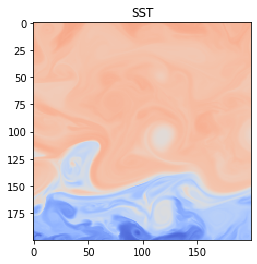

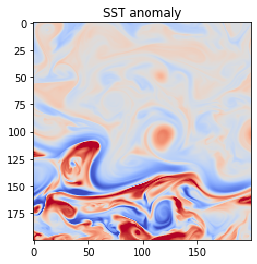

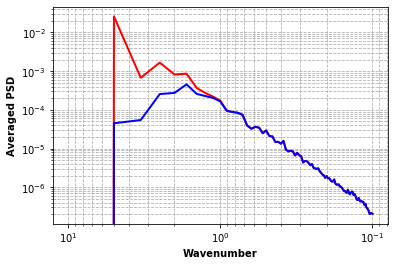

In [ ]:
def avg_rapsd2dv1(img3d,res,hanning):
    """ Computes and plots radially averaged power spectral density mean (power
     spectrum) of an image set img3d along the first dimension.
    """
    N = img3d.shape[0]
    for i in range(N):
        img=img3d[i,:,:]
        f_, Pf_ = rapsd2dv1(img,res,hanning)
        if i==0:
            f, Pf = f_, Pf_
        else:
            f = np.vstack((f,f_))
            Pf= np.vstack((Pf,Pf_))
    Pf = np.mean(Pf,axis=0)
    return f_, Pf


# Compute Signal-to-Noise ratio
res = 1. / 20.
hanning = True
f, pf_sst = rapsd2dv1(sst_gt_tt,res,hanning)
f, pf_sst_ano = rapsd2dv1(sst_ano_tt,res,hanning)
wf = 1./f

# plot Signal-to-Noise ratio
fig = plt.figure()
imgplot = plt.imshow( sst_gt_tt ,vmin=-2,vmax=2)
imgplot.set_cmap('coolwarm')
#plt.colorbar()
plt.title('SST')

fig = plt.figure()
imgplot = plt.imshow( sst_ano_tt ,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
#plt.colorbar()
plt.title('SST anomaly')

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(wf,pf_sst,color='red',linewidth=2,label='OI')
ax.plot(wf,pf_sst_ano,color='blue',linewidth=2,label='4DVarNet')
ax.set_xlabel("Wavenumber", fontweight='bold')
ax.set_ylabel("Averaged PSD", fontweight='bold')
ax.set_xscale('log') ; ax.set_yscale('log')
#plt.legend(loc='best',prop=dict(size='small'),frameon=False)
#plt.xticks([0.1, 0.5, 1.0, 5.0, 10.0], ["0.1", "0.5", "1.0", "5.0", "10.0"])
#plt.xticks([50, 100, 200, 500, 1000], ["50km", "100km", "200km", "500km", "1000km"])
ax.invert_xaxis()
plt.grid(which='both', linestyle='--')


Text(0.5, 1.0, 'Filtered SST anomaly')

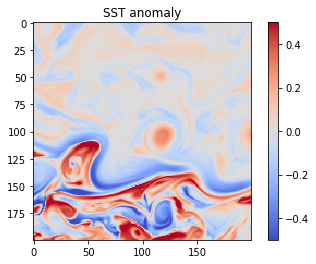

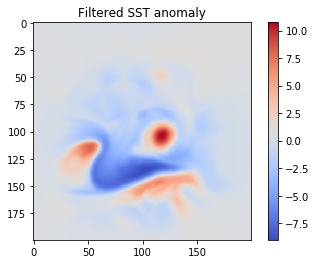

In [ ]:
## SGQ : Laplacian filter

img = sst_ano_tt

def compute_sqg_filter(img):
    
    if len( img.shape ) == 3 :
        img_inv = 0. * img
        for n in range(0,img.shape[0]):
            img_inv[n,:,:] = compute_sqg_filter( img[n,:,:])
        
    else:
        img = hanning2d(*img.shape) * img
        imgf = np.fft.fftshift(np.fft.fft2(img))


        FreqCompRows = np.fft.fftfreq(img.shape[0],d=1.)
        FreqCompCols = np.fft.fftfreq(img.shape[1],d=1.)
        FreqCompRows = np.fft.fftshift(FreqCompRows)
        FreqCompCols = np.fft.fftshift(FreqCompCols)

        S,D = np.meshgrid(FreqCompRows, FreqCompCols)
        w = np.sqrt( S**2 + D**2 )
        alpha = 1. + 0. * w
        alpha[ np.where( w > 0. ) ] = 1. / w[ np.where( w > 0. ) ]

        img_inv = np.real( np.fft.ifft2( np.fft.ifftshift( alpha * imgf ) ) )

    return img_inv

sst_ano_sqg_tt = compute_sqg_filter( sst_ano_tt )
fig = plt.figure()
imgplot = plt.imshow( sst_ano_tt ,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()
plt.title('SST anomaly')

fig = plt.figure()
imgplot = plt.imshow( sst_ano_sqg_tt )#,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()
plt.title('Filtered SST anomaly')

In [ ]:
len( ssh_ano_tt.shape )

2

... R2 = -0.477402 -- alpha = -0.003856 


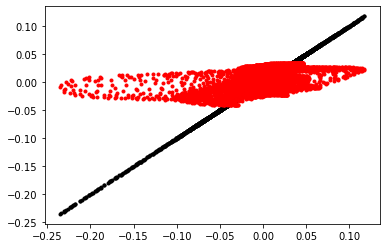

In [ ]:

ssh_ano_tt = hanning2d(*img.shape) * (ssh_gt_tt-ssh_oi_tt)

alpha = np.mean( ssh_ano_tt * sst_ano_sqg_tt ) / np.mean( sst_ano_sqg_tt * sst_ano_sqg_tt )
R2 = np.corrcoef(ssh_ano_tt.ravel(), sst_ano_sqg_tt.ravel())[0,1]

fig = plt.figure()
plt.plot( ssh_ano_tt.ravel() , ssh_ano_tt.ravel(), 'k.' )
plt.plot( ssh_ano_tt.ravel() , alpha * sst_ano_sqg_tt.ravel(), 'r.' )

print('... R2 = %f -- alpha = %f '%(R2,alpha))



... MSE OI = 2.693e-03 -- MSE = 2.166e-03
... NMSE vs OI = 19.57


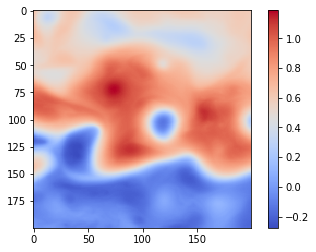

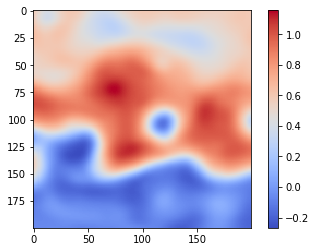

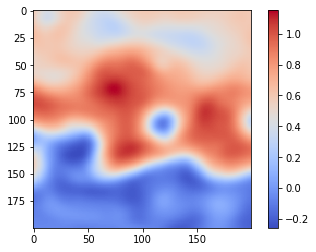

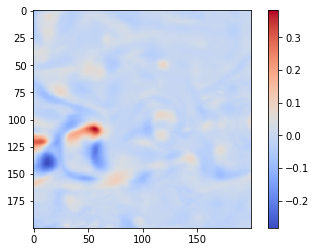

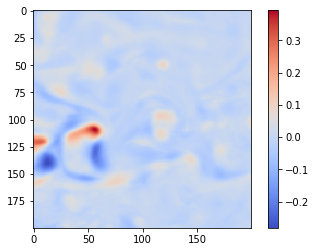

In [ ]:
ssh_sqg_rec = ssh_oi_tt + alpha * sst_ano_sqg_tt

plt.figure(0)
imgplot = plt.imshow( ssh_gt_tt )#,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()


plt.figure(1)
imgplot = plt.imshow( ssh_sqg_rec )#,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()


plt.figure(2)
imgplot = plt.imshow( ssh_oi_tt )#,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()

plt.figure(3)
imgplot = plt.imshow( ssh_sqg_rec-ssh_gt_tt )#,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()

plt.figure(4)
imgplot = plt.imshow( ssh_oi_tt-ssh_gt_tt )#,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()


mse_sqg = np.mean( (ssh_sqg_rec[50:150,50:150]-ssh_gt_tt[50:150,50:150])**2 )
mse_oi = np.mean( (ssh_oi_tt[50:150,50:150]-ssh_gt_tt[50:150,50:150])**2 )

print('... MSE OI = %.3e -- MSE = %.3e'%(mse_oi,mse_sqg))
print('... NMSE vs OI = %.2f'%(100. * (1. - mse_sqg/mse_oi)) )

In [ ]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit_intercept = False

model.fit(sst_ano_sqg_tt.ravel().reshape(-1, 1),ssh_ano_tt.ravel().reshape(-1, 1))

r_sq = model.score(sst_ano_sqg_tt.ravel().reshape(-1, 1),ssh_ano_tt.ravel().reshape(-1, 1))
print('coefficient of determination:', r_sq)
print('slope: %f'%model.coef_)



coefficient of determination: 0.22446387194206255
slope: -0.003856


.... MSE SSH OI : 2.69e-03 / 98.28%
.... MSE SSH : 2.17e-03 / 98.62% / 19.57%
.... MSE gSSH : 6.67e-05 / 76.94% / 16.21%


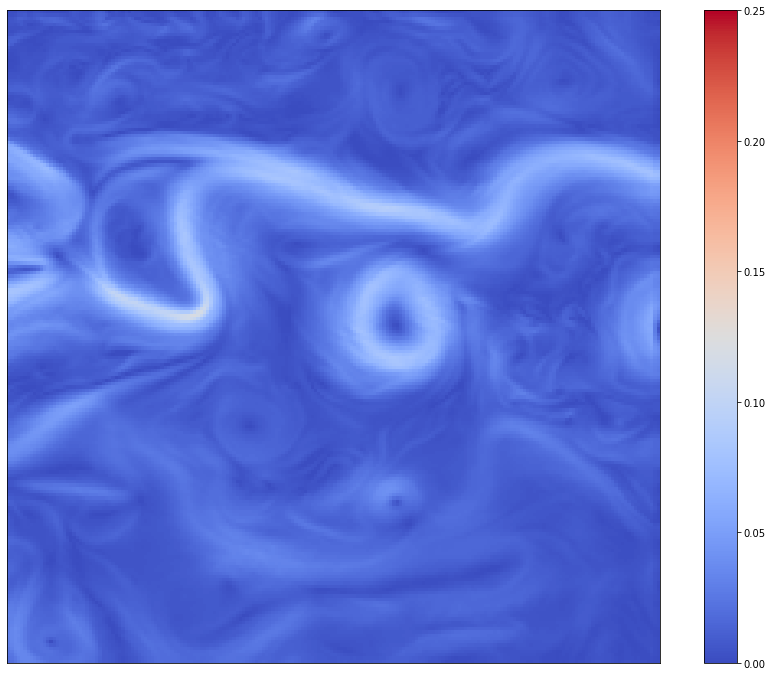

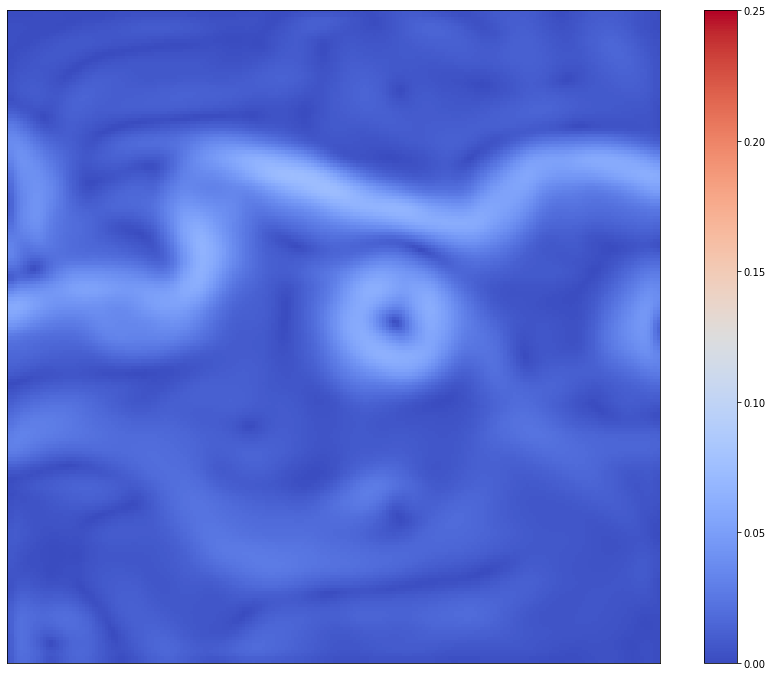

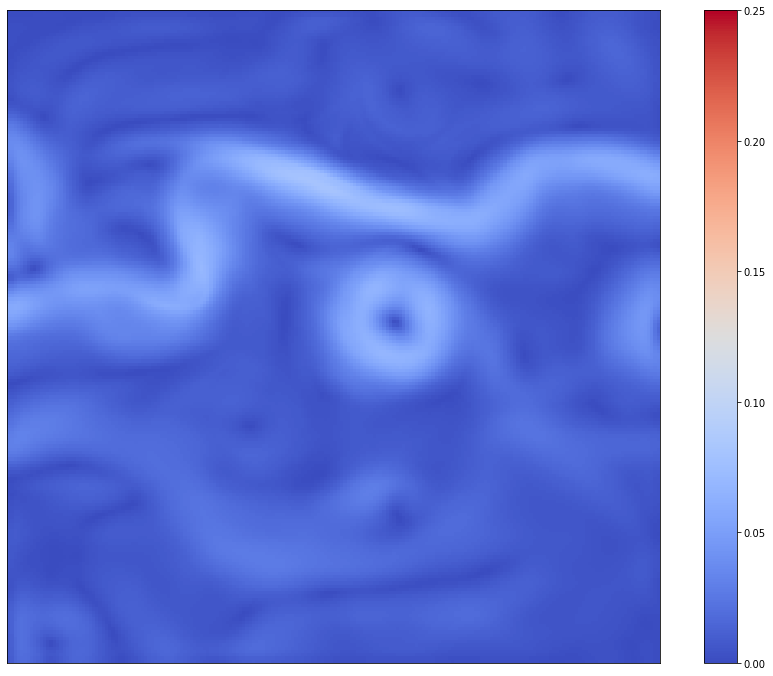

In [ ]:
gssh_max = 0.25
ddu = 1.
ddv = 1.

gx,gy = np.gradient( ssh_gt_tt )
ng_ssh_gt_tt = np.sqrt( (ddv*gx)**2 + (ddu*gy)**2 )
gx,gy = np.gradient( ssh_sqg_rec )
ng_ssh_sqg_tt = np.sqrt( (ddv*gx)**2 + (ddu*gy)**2 )
gx,gy = np.gradient( ssh_oi_tt )
ng_ssh_oi_tt = np.sqrt( (ddv*gx)**2 + (ddu*gy)**2 )

fig= plt.figure(3)
imgplot = plt.imshow( np.flipud(ng_ssh_gt_tt) ,vmin=0,vmax=gssh_max)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)

plt.colorbar()
if savefig == True :
    fig.set_size_inches(16, 12)
    fig.savefig('/tmp/ssh_grad_true_d%02d.png'%tt,dpi=100)
else:
    plt.title('$ \| D ssh_{true}\|$')

fig= plt.figure(4)
imgplot = plt.imshow( np.flipud(ng_ssh_oi_tt) ,vmin=0,vmax=gssh_max)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)

plt.colorbar()
if savefig == True :
    fig.set_size_inches(16, 12)
    fig.savefig('/tmp/ssh_grad_oi_d%02d.png'%tt)
else:
    plt.title('$ \| D ssh_{oi}\|$')


fig= plt.figure(5)
imgplot = plt.imshow( np.flipud(ng_ssh_sqg_tt) ,vmin=0,vmax=gssh_max)
imgplot.set_cmap('coolwarm')
ax = plt.gca()
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
plt.tick_params(left = False)
plt.tick_params(bottom = False)

plt.colorbar()
if savefig == True :
    fig.set_size_inches(16, 12)
    fig.savefig('/tmp/ssh_grad_4dvarnet_SLASST_d%02d.png'%tt)
else:
    plt.title('$ \| D ssh_{rec}\|$')

mse_ssh = np.mean((ssh_gt_tt[50:150,50:150]-ssh_sqg_rec[50:150,50:150])**2)
mse_gssh = np.mean((ng_ssh_gt_tt[50:150,50:150]-ng_ssh_sqg_tt[50:150,50:150])**2)
mse_oi = np.mean((ssh_gt_tt[50:150,50:150]-ssh_oi_tt[50:150,50:150])**2)
mse_goi = np.mean((ng_ssh_gt_tt[50:150,50:150]-ng_ssh_oi_tt[50:150,50:150])**2)

print(".... MSE SSH OI : %.2e / %.2f%%"%(mse_oi,100.*(1.-mse_oi/np.var(ssh_gt_tt))))
print(".... MSE SSH : %.2e / %.2f%% / %.2f%%"%(mse_ssh,100.*(1.-mse_ssh/np.var(ssh_gt_tt)) ,100.*(1.-mse_ssh/mse_oi)))
print(".... MSE gSSH : %.2e / %.2f%% / %.2f%%"%(mse_gssh,100.*(1.-mse_gssh/np.var(ng_ssh_gt_tt)),100.*(1.-mse_gssh/mse_goi)))




/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:107: RuntimeWarning: Mean of empty slice
/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in power
/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in multiply
/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:107: RuntimeWarning: Mean of empty slice
/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:107: RuntimeWarning: Mean of empty slice
/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:107: RuntimeWarning: Mean of empty slice


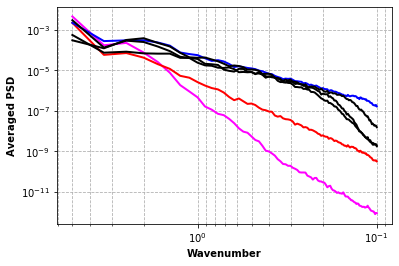

In [ ]:
## Spectral analysis of SST features

def compute_frac_laplacian_filter(img,alpha=1.):
    
    if len( img.shape )  == 3:
        img_inv = 0. * img
        for n in range(0,img.shape[0]):
            img_inv[n,:,:] = compute_sqg_filter( img[n,:,:])
        
    else:
        img = hanning2d(*img.shape) * img
        imgf = np.fft.fftshift(np.fft.fft2(img))


        FreqCompRows = np.fft.fftfreq(img.shape[0],d=1.)
        FreqCompCols = np.fft.fftfreq(img.shape[1],d=1.)
        FreqCompRows = np.fft.fftshift(FreqCompRows)
        FreqCompCols = np.fft.fftshift(FreqCompCols)

        S,D = np.meshgrid(FreqCompRows, FreqCompCols)
        theta, w = cart2pol(S, D)
        #w = np.power( S**2 + D**2 , 0.5 * alpha ) 
        w = np.power( w , alpha ) 
        alpha_w = 1. + 0. * w
        alpha_w[ np.where( w > 0. ) ] = 1. / w[ np.where( w > 0. ) ]

        img_inv = np.real( np.fft.ifft2( np.fft.ifftshift( alpha_w * imgf ) ) )

    return img_inv

# Compute Signal-to-Noise ratio
res = 1. / 20.
hanning = True
alpha_lap = -0.75
f, pf_ssh = rapsd2dv1(ssh_gt_tt,res,hanning,compute_mean=True)
f, pf_sst = rapsd2dv1(sst_gt_tt,res,hanning,compute_mean=True)
f, pf_sst_sqg = rapsd2dv1( compute_frac_laplacian_filter(sst_gt_tt,alpha_lap),res,hanning,compute_mean=True)
wf = 1./f

pf_sst_sqg = (pf_sst[1] / pf_sst_sqg[1]) * pf_sst_sqg

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(wf,pf_ssh,color='magenta',linewidth=2,label='SSH')
ax.plot(wf,pf_sst,color='red',linewidth=2,label='SST')
ax.plot(wf,pf_sst_sqg,color='blue',linewidth=2,label='SQG')
for kk in range(0,3):
    f, pf_sst_feat = rapsd2dv1(sst_feat_tt[indSST[kk]+1,:,:].squeeze(),res,hanning,compute_mean=True)
    ax.plot(wf,pf_sst_feat,color='black',linewidth=2,label='Feat%d'%(kk+1))
ax.set_xlabel("Wavenumber", fontweight='bold')
ax.set_ylabel("Averaged PSD", fontweight='bold')
ax.set_xscale('log') ; 
ax.set_yscale('log')
#plt.legend(loc='best',prop=dict(size='small'),frameon=False)
#plt.xticks([0.1, 0.5, 1.0, 5.0, 10.0], ["0.1", "0.5", "1.0", "5.0", "10.0"])
#plt.xticks([50, 100, 200, 500, 1000], ["50km", "100km", "200km", "500km", "1000km"])
ax.invert_xaxis()
plt.grid(which='both', linestyle='--')

In [ ]:
def apply_gaussian_filter(img, sigma=1.):
    if len( img.shape ) == 3 :
        f_img = 1. * img

        for kk in range(0,img.shape[0]):
            f_img[kk,:,:] = gaussian_filter(img[kk,:,:], sigma= sig_smoothing)
    else:
        f_img = gaussian_filter(img, sigma= sig_smoothing)
    return f_img


def compute_sqg_filter(img):
    
    if len( img.shape ) == 3 :
        img_inv = 0. * img
        for n in range(0,img.shape[0]):
            img_inv[n,:,:] = compute_sqg_filter( img[n,:,:])
        
    else:
        img = hanning2d(*img.shape) * img
        imgf = np.fft.fftshift(np.fft.fft2(img))


        FreqCompRows = np.fft.fftfreq(img.shape[0],d=1.)
        FreqCompCols = np.fft.fftfreq(img.shape[1],d=1.)
        FreqCompRows = np.fft.fftshift(FreqCompRows)
        FreqCompCols = np.fft.fftshift(FreqCompCols)

        S,D = np.meshgrid(FreqCompRows, FreqCompCols)
        w = np.sqrt( S**2 + D**2 )
        alpha = 1. + 0. * w
        alpha[ np.where( w > 0. ) ] = 1. / w[ np.where( w > 0. ) ]

        img_inv = np.real( np.fft.ifft2( np.fft.ifftshift( alpha * imgf ) ) )

    return img_inv

def hanning2d(M, N):
    """
    A 2D hanning window, as per IDL's hanning function.  See numpy.hanning for the 1d description
    """

    if N <= 1:
        return np.hanning(M)
    elif M <= 1:
        return np.hanning(N) # scalar unity; don't window if dims are too small
    else:
        return np.outer(np.hanning(M),np.hanning(N))



In [ ]:
### SQG-based processing

def apply_inverse_sqg(sst,ssh,ssh_oi,niter_smoothing=100,niter_smoothing_ano=0,sigma=1.):

    s_sst = 1. * sst
    for nn in range(0,niter_smoothing):
        s_sst = apply_gaussian_filter(s_sst, sigma= sig_smoothing)

    sst_ano = sst - s_sst

    if niter_smoothing_ano > 0 :
        for nn in range(0,niter_smoothing_ano):
            sst_ano = apply_gaussian_filter(sst_ano, sigma= sig_smoothing)

    ### apply SGQ inverse filter
    sst_ano_sqg = compute_sqg_filter( sst_ano )

    if len(ssh.shape) == 3:
        hanning_window = hanning2d(*ssh.shape[1:])
        ssh_ano = ssh-ssh_oi
        for kk in range(0,ssh.shape[0]):
                ssh_ano[kk,:,:] = ssh_ano[kk,:,:] * hanning_window        
    else:
        ssh_ano = hanning2d(*ssh.shape) * (ssh-ssh_oi)
    alpha = np.mean( ssh_ano * sst_ano_sqg ) / np.mean( sst_ano_sqg * sst_ano_sqg )
    R2 = np.corrcoef(ssh_ano.ravel(), sst_ano_sqg.ravel())[0,1]

    #print(alpha)
    #print(R2)
    ### reconstructed field
    ssh_sqg_rec = ssh_oi + alpha * sst_ano_sqg

    return ssh_sqg_rec

if 1*0 :
    sst_gt_ = sst_feat_tt[0,:,:]
    ssh_oi_ = ssh_oi_tt
    ssh_gt_ = ssh_gt_tt
else:
    sst_gt_ = sst_feat[0:tt+2,0,:,:]
    ssh_oi_ = 1. * ssh_oi[0:tt+2,:,:]
    ssh_gt_ = 1. * ssh_gt[0:tt+2,:,:]


### high-pass filtering applied to SST
niter_smoothing = 100
sig_smoothing = 1.
niter_smoothing_ano = 0

ssh_sqg_rec = apply_inverse_sqg(sst_gt_,ssh_gt_,ssh_oi_,niter_smoothing,niter_smoothing_ano,sig_smoothing)   


In [ ]:
ssh_sqg_rec.shape

(27, 200, 200)

... MSE OI = 2.693e-03 -- MSE = 2.155e-03
... NMSE vs OI = 19.97


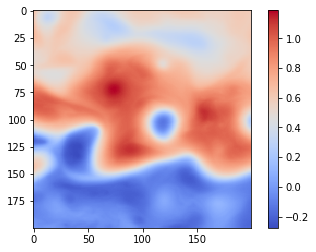

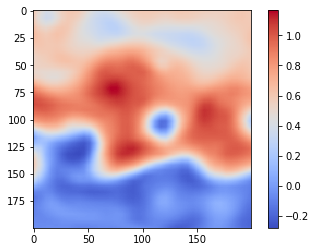

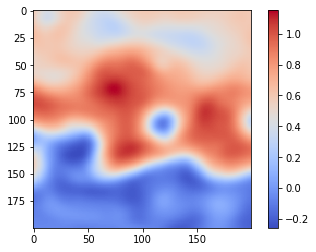

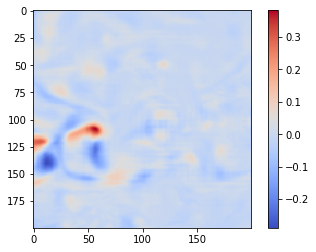

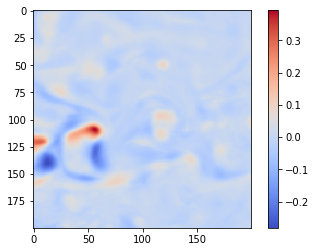

In [ ]:
if 1*1 :
    ssh_sqg_rec_tt = ssh_sqg_rec[tt,:,:].squeeze()
else:
    ssh_sqg_rec_tt = ssh_sqg_rec

plt.figure(0)
imgplot = plt.imshow( ssh_gt_tt )#,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()


plt.figure(1)
imgplot = plt.imshow( ssh_sqg_rec_tt )#,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()


plt.figure(2)
imgplot = plt.imshow( ssh_oi_tt )#,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()

plt.figure(3)
imgplot = plt.imshow( ssh_sqg_rec_tt-ssh_gt_tt )#,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()

plt.figure(4)
imgplot = plt.imshow( ssh_oi_tt-ssh_gt_tt )#,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()


mse_sqg = np.mean( (ssh_sqg_rec_tt[50:150,50:150]-ssh_gt_tt[50:150,50:150])**2 )
mse_oi = np.mean( (ssh_oi_tt[50:150,50:150]-ssh_gt_tt[50:150,50:150])**2 )

print('... MSE OI = %.3e -- MSE = %.3e'%(mse_oi,mse_sqg))
print('... NMSE vs OI = %.2f'%(100. * (1. - mse_sqg/mse_oi)) )

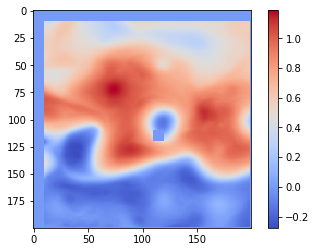

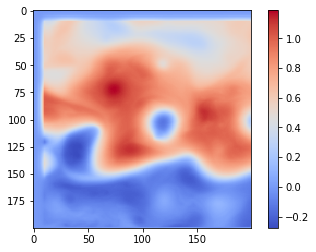

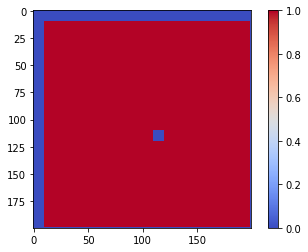

In [ ]:
def interpolation_diffusion(x,mask,alpha,n_iter):
    
    avg_x = 0. * x
    for iter in range(0,n_iter):
        dx = 0. * x
        
        avg_x[:,1:x.shape[1]-1,1:x.shape[2]-1] = x[:,0:x.shape[1]-2,1:x.shape[2]-1] + x[:,2:x.shape[1],1:x.shape[2]-1]
        avg_x[:,1:x.shape[1]-1,1:x.shape[2]-1] = x[:,1:x.shape[1]-1,0:x.shape[2]-2] + x[:,1:x.shape[1]-1,2:x.shape[2]] + avg_x[:,1:x.shape[1]-1,1:x.shape[2]-1]

        dx[:,1:x.shape[1]-1,1:x.shape[2]-1] = 0.25 * avg_x[:,1:x.shape[1]-1,1:x.shape[2]-1] - x[:,1:x.shape[1]-1,1:x.shape[2]-1]
        
        avg_x[:,1:x.shape[1]-1,0] = x[:,0:x.shape[1]-2,0] + x[:,2:x.shape[1],0]
        avg_x[:,1:x.shape[1]-1,0] = x[:,1:x.shape[1]-1,2] + avg_x[:,1:x.shape[1]-1,0]
        dx[:,1:x.shape[1]-1,0] = ( 1. / 3 ) * avg_x[:,1:x.shape[1]-1,0] - x[:,1:x.shape[1]-1,0]

        avg_x[:,1:x.shape[1]-1,-1] = x[:,0:x.shape[1]-2,-1] + x[:,2:x.shape[1],-1]
        avg_x[:,1:x.shape[1]-1,-1] = x[:,1:x.shape[1]-1,x.shape[2]-2] + avg_x[:,1:x.shape[1]-1,-1]
        dx[:,1:x.shape[1]-1,-1] = ( 1. / 3 ) * avg_x[:,1:x.shape[1]-1,-1] - x[:,1:x.shape[1]-1,-1]

        avg_x[:,0,1:x.shape[2]-1] = x[:,0,0:x.shape[2]-2] + x[:,0,2:x.shape[2]]
        avg_x[:,0,1:x.shape[2]-1] = x[:,2,1:x.shape[2]-1] + avg_x[:,0,1:x.shape[2]-1]
        dx[:,0,1:x.shape[2]-1] = ( 1. / 3 ) * avg_x[:,0,1:x.shape[2]-1] - x[:,0,1:x.shape[2]-1]

        avg_x[:,-1,1:x.shape[2]-1] = x[:,-1,0:x.shape[1]-2] + x[:,-1,2:x.shape[1]]
        avg_x[:,-1,1:x.shape[2]-1] = x[:,x.shape[1]-2,1:x.shape[1]-1] + avg_x[:,-1,1:x.shape[1]-1]
        dx[:,-1,1:x.shape[2]-1] = ( 1. / 3 ) * avg_x[:,1:x.shape[1]-1,0] - x[:,-1,1:x.shape[1]-1]


        x = x + alpha * dx * ( 1. - mask )
    
    return x


x_test = ssh_gt_tt.reshape(1,200,200)
x_test[:,110:120,110:120] = 0.
x_test[:,0:10,:] = 0.
x_test[:,-1,:] = 0.
x_test[:,:,0:10] = 0.
x_test[:,:,-1] = 0.



mask = 1. + 0. * x_test
mask[:,110:120,110:120] = 0.
mask[:,0:10,:] = 0.
mask[:,-1,:] = 0.
mask[:,:,0:10] = 0.
mask[:,:,-1] = 0.


x_interp = interpolation_diffusion(x_test,mask,0.25,100)


plt.figure(1)
imgplot = plt.imshow( x_test.squeeze() )#,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()


plt.figure(2)
imgplot = plt.imshow( x_interp.squeeze() )#,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()

plt.figure(3)
imgplot = plt.imshow( mask.squeeze() )#,vmin=-0.5,vmax=0.5)
imgplot.set_cmap('coolwarm')
plt.colorbar()

In [ ]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Tue May  3 09:33:28 2022

@author: rfablet
"""
""" Parts of the U-Net model """

import torch
import torch.nn as nn
import torch.nn.functional as F


class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)


class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)

class Down4(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(4),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)


class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels * 2, out_channels)

            #self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        print(x1.size())
        x1 = self.up(x1)
        print(x1.size())
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        # if you have padding issues, see
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class Up4(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=4, stride=4)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 4, diffX - diffX // 4,
                        diffY // 4, diffY - diffY // 4])
        # if you have padding issues, see
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)
    
    
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=False):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        
        #self.down4 = Down(512, 1024 // factor)
        #self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        #x5 = self.down4(x4)
        #x = self.up1(x5, x4)
        #x5 = self.down4(x4)
        #x = self.up1(x5, x4)
        #print(x3.shape)
        #print(x4.shape)
        x = self.up2(x4, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        out = self.outc(x)
        
        return out
    
    
class UNet3(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=False):
        super(UNet3, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        #self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        
        #self.down4 = Down(512, 1024 // factor)
        #self.up1 = Up(1024, 512 // factor, bilinear)
        #self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        #x4 = self.down3(x3)
        #x5 = self.down4(x4)
        #x = self.up1(x5, x4)
        #x5 = self.down4(x4)
        #x = self.up1(x5, x4)
        #print(x3.shape)
        #print(x4.shape)
        #x = self.up2(x4, x3)
        x = self.up3(x3, x2)
        x = self.up4(x, x1)
        out = self.outc(x)
        
        return out

class UNet2(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=False):
        super(UNet2, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 16)
        self.down1 = Down(16, 32)
        self.down2 = Down(32, 64)
        self.down3 = Down(64, 128)
        factor = 2 if bilinear else 1
        
        #self.down4 = Down(512, 1024 // factor)
        #self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(128, 64 // factor, bilinear)
        self.up3 = Up(64, 32 // factor, bilinear)
        self.up4 = Up(32, 16, bilinear)
        self.outc = OutConv(16, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        #x5 = self.down4(x4)
        #x = self.up1(x5, x4)
        #x5 = self.down4(x4)
        #x = self.up1(x5, x4)

        x = self.up2(x4, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        out = self.outc(x)
        
        return out
    

class DoubleConvBILIN(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
            
        self.conv1  = nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False)
        self.conv21 = nn.Conv2d(mid_channels, mid_channels, kernel_size=3, padding=1, bias=False)
        self.conv22 = nn.Conv2d(mid_channels, mid_channels, kernel_size=3, padding=1, bias=False)
        self.conv23 = nn.Conv2d(mid_channels, mid_channels, kernel_size=3, padding=1, bias=False)
        self.conv24 = nn.Conv2d(2*mid_channels, out_channels, kernel_size=3, padding=1, bias=False)

        self.bn1 = nn.BatchNorm2d(mid_channels)
        self.bn2 = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        x1 = self.conv1(x)
        x1 = F.relu( self.bn1(x1) )
        
        x11 = self.conv21(x1) 
        x12 = self.conv22(x1) 
        x13 = self.conv23(x1) 
        x1 = self.conv24( torch.cat((x11,x12*x13),dim=1) )
        
        x1 = self.bn2(x1)
        
        return x1
    
class UNet5(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=False):
        super(UNet5, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConvBILIN(n_channels, 64)
        self.down1 = Down4(64, 128)
        self.up4 = Up4(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x = self.up4(x2, x1)
        out = self.outc(x)
 

In [ ]:
phi = UNet5(14,14,False)

t_in = torch.Tensor( np.ones((10,14,240,240)) )
out = phi(t_in)
print('Number of trainable parameters = %d' % (sum(p.numel() for p in phi.parameters() if p.requires_grad))) 

Number of trainable parameters = 657230


In [ ]:
phi = UNet(14,14,True)

t_in = torch.Tensor( np.ones((10,14,240,240)) )
out = phi(t_in)

torch.Size([10, 512, 30, 30])
torch.Size([10, 512, 60, 60])


RuntimeError: Given groups=1, weight of size [128, 1024, 3, 3], expected input[10, 768, 60, 60] to have 1024 channels, but got 768 channels instead